In [1]:
import DoA

<IPython.core.display.Javascript object>


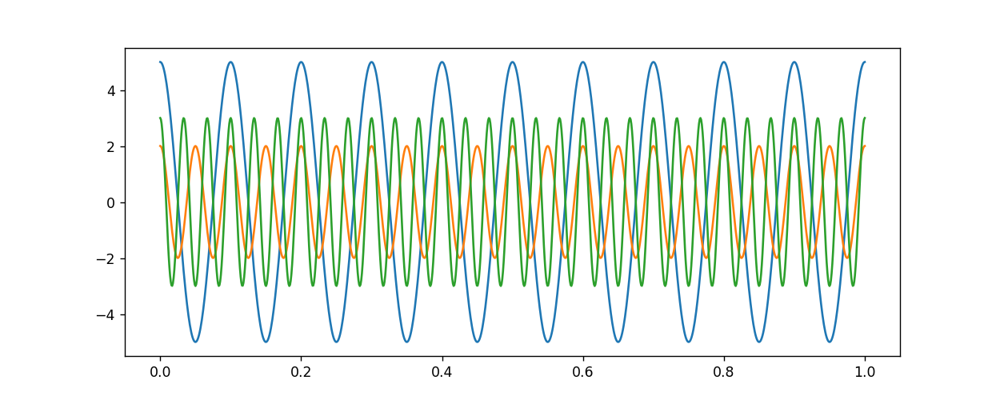

<IPython.core.display.Javascript object>


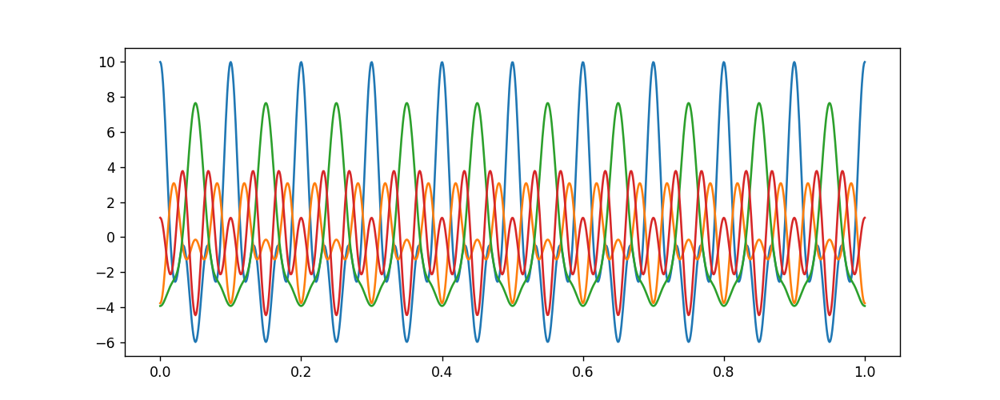

<IPython.core.display.Javascript object>


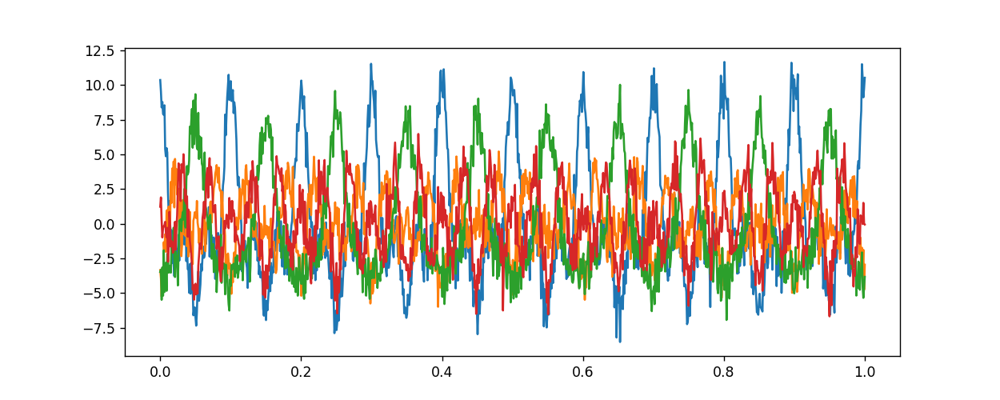

In [5]:
# 4 anten, 3 kaynak. #ilk baş 3 kaynak sinyalini oluşturalım.
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
pi = np.pi
t = np.linspace(0,1,1000)
D = 4 #anten sayısı
M = 3 #kaynak sayısı
lamda = 1
delta = lamda/2 #antenler arasındaki mesafe dalga boyunun yarısı kadar olsun.
tetha = np.array([30,70,45])
fc = 100000 #100 kHz
f = [10,20,30]

original_source_signal = [5*np.cos(2*pi*f[0]*t),2*np.cos(2*pi*f[1]*t),3*np.cos(2*pi*f[2]*t)] #s(t)
noise = np.random.randn(4,len(t)) #n(t) M adet dizi elemanı için kanal gürültüsüdür. Bizim için M 4 tür. Burada ortalaması 0 varyansı 1
#olan standart gauss dağılımıyla rastgele değer oluşturan randn fonksiyonuyla 4 ayrı t vektörünün büyüklüğü kadar AWGN elde edilmiştir.
#bu noise ile orijinal kaynak sinyalinin boyutları uymadığı için 4 değil 3 adet gürültü ürettim.

#xt = original_source_signal + noise

c = 2.998*10**8
#lamda = [c/f[0],c/f[1],c/f[2]] # c ışık hızı, f ise 3 sinyalin ayrı ayrı frekansları. Dalga boyu hesaplanıyor burada.

mü = []
#listeler içinde bölme işlemi yapamadığım için formüllerin belli parçalarını aşağıda tanımlayıp liste içinde o tanımladıklarımı kullanıyorum.
radyan = pi/180
#pre = ((-2*pi)/lamda[]) # (−2π)/λ bunu yazdık.

#Mü_i leri oluşturmak için aşağıdaki kod bloğu kullanılıyor. i kaynak sayısı kadar itere olacak.Makalede verilen formül uygulandı 
#bahsedilen formül Eq.(6) dır. Bu mü_i terimi spatial frequency olarak geçiyor.
pre = ((-2*pi)/lamda)
for item in tetha:
    mü.append(pre*delta*np.sin(item*radyan))

#Aşağıdaki döngü bloğu ise makaledeki eq.(7) yi uygulamak içindir. 
a_mü= np.array([[0 for row in range(4)] for col in range(3)],dtype=np.complex_) #dtype=np.complex_ yapmazsak arraye complex değerler koyamıyoruz.
for element in range(M):# kaynak = 3
    for item in range(D):# Anten = 4
        a_mü[element][item]=(np.exp(1j*mü[element]*item)) #a(µi) vektörü.

        
A = np.transpose(a_mü) #steering matrix
x_t = np.matmul(A,original_source_signal)
received_signal = x_t + noise

plt.figure(figsize=(10,4))
for item in original_source_signal:
    plt.plot(t,item)
    
plt.figure(figsize=(10,4))
for item in x_t:
    plt.plot(t,item)    
    
plt.figure(figsize=(10,4))
for item in received_signal:
    plt.plot(t,item)

In [ ]:
# 4 anten, 3 kaynak. #ilk baş 3 kaynak sinyalini oluşturalım.
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
pi = np.pi
t = np.linspace(0,1,1000)
D = 4 #anten sayısı
M = 3 #kaynak sayısı
lamda = 1
delta = lamda/2 #antenler arasındaki mesafe dalga boyunun yarısı kadar olsun.
tetha = np.array([30,70,45])
fc = 100000 #100 kHz
f = [10,20,30]

original_source_signal = [5*np.cos(2*pi*f[0]*t),2*np.cos(2*pi*f[1]*t),3*np.cos(2*pi*f[2]*t)] #s(t)
noise = np.random.randn(4,len(t)) #n(t) M adet dizi elemanı için kanal gürültüsüdür. Bizim için M 4 tür. Burada ortalaması 0 varyansı 1
#olan standart gauss dağılımıyla rastgele değer oluşturan randn fonksiyonuyla 4 ayrı t vektörünün büyüklüğü kadar AWGN elde edilmiştir.
#bu noise ile orijinal kaynak sinyalinin boyutları uymadığı için 4 değil 3 adet gürültü ürettim.

#xt = original_source_signal + noise

c = 2.998*10**8
#lamda = [c/f[0],c/f[1],c/f[2]] # c ışık hızı, f ise 3 sinyalin ayrı ayrı frekansları. Dalga boyu hesaplanıyor burada.

mü = []
#listeler içinde bölme işlemi yapamadığım için formüllerin belli parçalarını aşağıda tanımlayıp liste içinde o tanımladıklarımı kullanıyorum.
radyan = 180/pi
#pre = ((-2*pi)/lamda[]) # (−2π)/λ bunu yazdık.

#Mü_i leri oluşturmak için aşağıdaki kod bloğu kullanılıyor. i kaynak sayısı kadar itere olacak.Makalede verilen formül uygulandı 
#bahsedilen formül Eq.(6) dır. Bu mü_i terimi spatial frequency olarak geçiyor.
pre = ((-2*pi)/lamda)
for item in tetha:
    mü.append(pre*delta*np.sin(item*radyan))

#Aşağıdaki döngü bloğu ise makaledeki eq.(7) yi uygulamak içindir. 
a_mü= [[0 for row in range(4)] for col in range(3)]
for element in range(M):# kaynak = 3
    for item in range(D):# Anten = 4
        a_mü[element][item]=(np.exp(1j*mü[element]*item)) #a(µi) vektörü.

        
A = np.transpose(a_mü) #steering matrix
x_t = np.matmul(A,original_source_signal)
received_signal = x_t + noise

plt.figure(figsize=(10,4))
for item in original_source_signal:
    plt.plot(t,item)
    
plt.figure(figsize=(10,4))
for item in x_t:
    plt.plot(t,item)    
    
plt.figure(figsize=(10,4))
for item in received_signal:
    plt.plot(t,item)

<IPython.core.display.Javascript object>


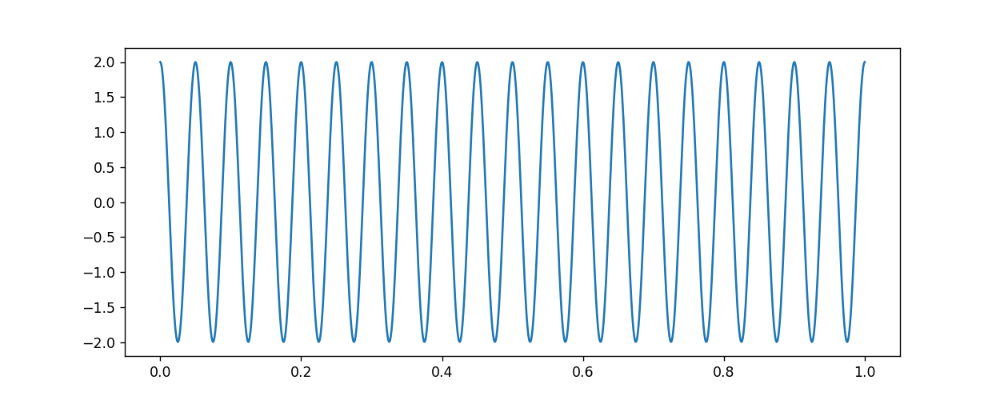

<IPython.core.display.Javascript object>


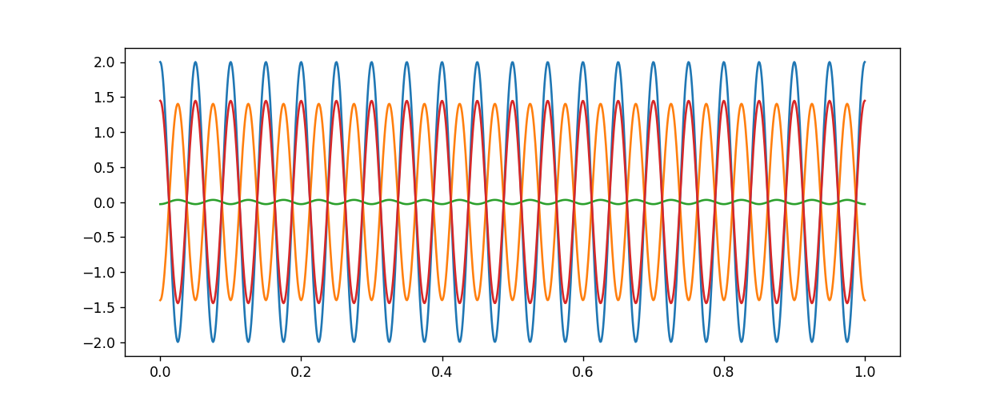

In [2]:
# 4 anten, 3 kaynak. #ilk baş 3 kaynak sinyalini oluşturalım.
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
pi = np.pi
t = np.linspace(0,1,1000)
D = 4 #anten sayısı
M = 1 #kaynak sayısı
lamda = 1
delta = lamda/2 #antenler arasındaki mesafe dalga boyunun yarısı kadar olsun.
tetha = np.array([60])
fc = 100000 #100 kHz
f = [10,20,30]

original_source_signal = [2*np.cos(2*pi*f[1]*t)] #s(t)
noise = np.random.randn(4,len(t)) #n(t) M adet dizi elemanı için kanal gürültüsüdür. Bizim için M 4 tür. Burada ortalaması 0 varyansı 1
#olan standart gauss dağılımıyla rastgele değer oluşturan randn fonksiyonuyla 4 ayrı t vektörünün büyüklüğü kadar AWGN elde edilmiştir.
#bu noise ile orijinal kaynak sinyalinin boyutları uymadığı için 4 değil 3 adet gürültü ürettim.

#xt = original_source_signal + noise

c = 2.998*10**8
#lamda = [c/f[0],c/f[1],c/f[2]] # c ışık hızı, f ise 3 sinyalin ayrı ayrı frekansları. Dalga boyu hesaplanıyor burada.

mü = []
#listeler içinde bölme işlemi yapamadığım için formüllerin belli parçalarını aşağıda tanımlayıp liste içinde o tanımladıklarımı kullanıyorum.
radyan = 180/pi
#pre = ((-2*pi)/lamda[]) # (−2π)/λ bunu yazdık.

#Mü_i leri oluşturmak için aşağıdaki kod bloğu kullanılıyor. i kaynak sayısı kadar itere olacak.Makalede verilen formül uygulandı 
#bahsedilen formül Eq.(6) dır. Bu mü_i terimi spatial frequency olarak geçiyor.
pre = ((-2*pi)/lamda)

for item in tetha:
    mü.append(pre*delta*np.sin(item*radyan))

#Aşağıdaki döngü bloğu ise makaledeki eq.(7) yi uygulamak içindir. 
a_mü= [[0 for row in range(D)] for col in range(M)]
for element in range(M):# kaynak = 1
    for item in range(D):# Anten = 4
        a_mü[element][item]=(np.exp(1j*mü[element]*item)) #a(µi) vektörü.

        
        
A = np.transpose(a_mü) #steering matrix
x_t = np.matmul(A,original_source_signal)
received_signal = x_t + noise

plt.figure(figsize=(10,4))
for item in original_source_signal:
    plt.plot(t,item)
count = 0 
phase = pi/2
plt.figure(figsize=(10,4))
for item in x_t:
    plt.plot(t,item)    
    count = count+1
plt.figure(figsize=(10,4))
for item in received_signal:
    plt.plot(t,item)

<IPython.core.display.Javascript object>


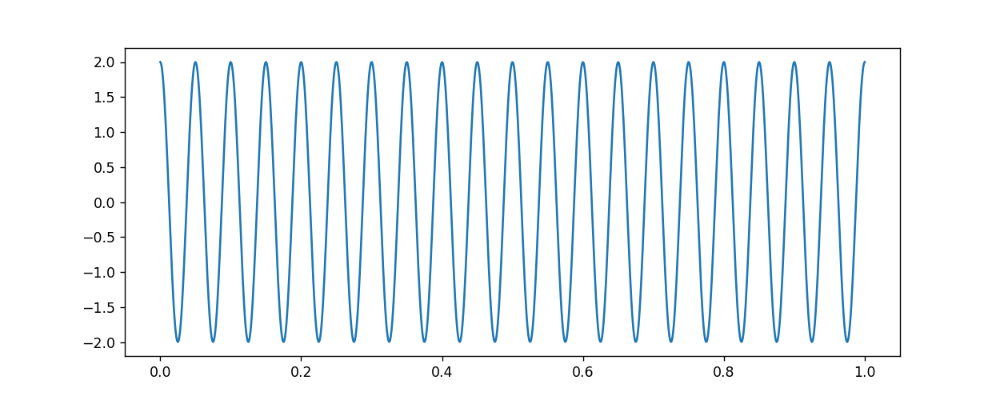

<IPython.core.display.Javascript object>


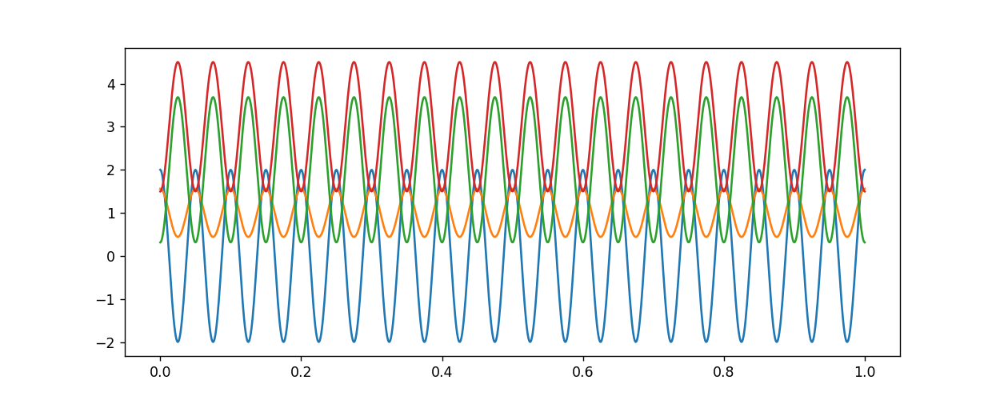

1
2
3
4


<IPython.core.display.Javascript object>


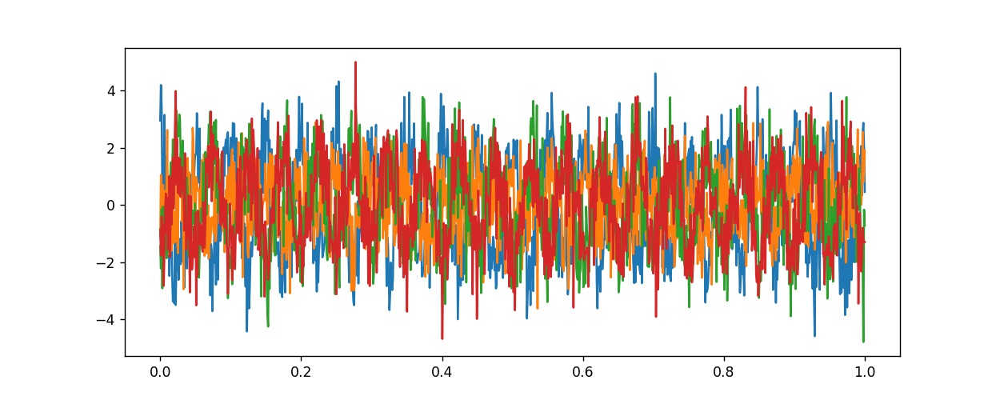

In [51]:
# 4 anten, 3 kaynak. #ilk baş 3 kaynak sinyalini oluşturalım.
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
pi = np.pi
t = np.linspace(0,1,1000)
D = 4 #anten sayısı
M = 1 #kaynak sayısı
lamda = 1
delta = lamda/2 #antenler arasındaki mesafe dalga boyunun yarısı kadar olsun.
tetha = np.array([30])
fc = 100000 #100 kHz
f = [10,20,30]

original_source_signal = [2*np.cos(2*pi*f[1]*t)] #s(t)
noise = np.random.randn(4,len(t)) #n(t) M adet dizi elemanı için kanal gürültüsüdür. Bizim için M 4 tür. Burada ortalaması 0 varyansı 1
#olan standart gauss dağılımıyla rastgele değer oluşturan randn fonksiyonuyla 4 ayrı t vektörünün büyüklüğü kadar AWGN elde edilmiştir.
#bu noise ile orijinal kaynak sinyalinin boyutları uymadığı için 4 değil 3 adet gürültü ürettim.

#xt = original_source_signal + noise

c = 2.998*10**8
#lamda = [c/f[0],c/f[1],c/f[2]] # c ışık hızı, f ise 3 sinyalin ayrı ayrı frekansları. Dalga boyu hesaplanıyor burada.

mü = []
#listeler içinde bölme işlemi yapamadığım için formüllerin belli parçalarını aşağıda tanımlayıp liste içinde o tanımladıklarımı kullanıyorum.
radyan = 180/pi
#pre = ((-2*pi)/lamda[]) # (−2π)/λ bunu yazdık.

#Mü_i leri oluşturmak için aşağıdaki kod bloğu kullanılıyor. i kaynak sayısı kadar itere olacak.Makalede verilen formül uygulandı 
#bahsedilen formül Eq.(6) dır. Bu mü_i terimi spatial frequency olarak geçiyor.
pre = ((-2*pi)/lamda)

for item in tetha:
    mü.append(pre*delta*np.sin(item*radyan))

#Aşağıdaki döngü bloğu ise makaledeki eq.(7) yi uygulamak içindir. 
a_mü= [[0 for row in range(D)] for col in range(M)]
for element in range(M):# kaynak = 1
    for item in range(D):# Anten = 4
        a_mü[element][item]=(np.exp(1j*mü[element]*item)) #a(µi) vektörü.

        
        
A = np.transpose(a_mü) #steering matrix
x_t = np.matmul(A,original_source_signal)
received_signal = x_t + noise

plt.figure(figsize=(10,4))
for item in original_source_signal:
    plt.plot(t,item)
count = 0 
plt.figure(figsize=(10,4))
for item in x_t:
    plt.plot(t,item+count)    
    count = count+1
    print(count)
plt.figure(figsize=(10,4))
for item in received_signal:
    plt.plot(t,item)

In [8]:
Cov_rec_sig = np.cov(received_signal)
print(f"Kovaryans matris\n{Cov_rec_sig}") #Kovaryans matrisi bulduk.
eigenvalues, eigenvectors = np.linalg.eig(Cov_rec_sig)
print(f'\n\nEigenvalues:\n{eigenvalues}\n\nEigenvector:\n{eigenvectors}')
Min_Eigenv = min(eigenvalues)
out = np.where(Min_Eigenv == eigenvalues) #bulduğumuz min eigenvalue nin dizi içindeki indeksini buluyoruz.
indeks = out[0][0]# indeks array şeklinde verildi. Saf indeks değerini çekiyoruz. Bu indeks değeriyle eigenvectoru bulacağız.
print(f'\n\nMinimum Eigenvalue:\n{Min_Eigenv}')
Vn = np.array([eigenvectors[:,indeks]]).T #Vn in transpozunu alıp dikey vektör haline getirdim. Eigenvectorler genelde sutun olarak alınır.
print(f'\n\nVn:\n{Vn}')
Vn_H = np.conjugate(Vn.T)
print(f'\n\nHermitian Vn:\n{Vn_H}')

angle = np.arange(-90,91,1)

mü_new = []
for item in angle:
    mü_new.append(pre*delta*np.sin(item*radyan))

a_mü_new = np.array([[0 for row in range(len(angle))] for col in range(D)],dtype=np.complex_) #dtype=np.complex_ yapmazsak arraye complex değerler koyamıyoruz.
for element in range(len(angle)):# kaynak = 3
    for item in range(D):# Anten = 4
        a_mü_new[item][element]=(np.exp(1j*mü_new[element]*item)) #a(µi) vektörü.
a_mü_new.shape #4x1000
a_mü_new_H = np.conjugate(a_mü_new.T)
a_mü_new_H.shape #1000x4

Pmusic = np.array([0 for i in range(len(angle))])
for item in range(len(angle)):
    final = np.matmul(a_mü_new_H[item],Vn @ Vn_H @ a_mü_new[:,item])
    #first = np.matmul(a_mü_new_H[item],Vn)
    #second = np.matmul(first,Vn_H)
    #final = np.matmul(second,a_mü_new[:,item])
    Pmusic[item]=abs((1/(final)))

Kovaryans matris
[[ 20.04102827+0.00000000e+00j  -4.93406854+1.65212558e+01j
  -11.8442818 -5.17827010e+00j   2.53793705-9.70398733e+00j]
 [ -4.93406854-1.65212558e+01j  20.2164924 +1.44326976e-17j
   -4.5220993 +1.64115995e+01j -11.85956397-4.80056214e+00j]
 [-11.8442818 +5.17827010e+00j  -4.5220993 -1.64115995e+01j
   19.6579269 +1.59923531e-18j  -4.42239605+1.63945999e+01j]
 [  2.53793705+9.70398733e+00j -11.85956397+4.80056214e+00j
   -4.42239605-1.63945999e+01j  20.2268789 +2.37483954e-17j]]


Eigenvalues:
[63.42638646+2.78502573e-15j 13.86659091+1.67992288e-16j
  1.82836941+1.46110161e-15j  1.02097969-1.52753977e-15j]

Eigenvector:
[[-0.08445598+0.46324389j -0.56049673+0.26057269j  0.58394585+0.j
  -0.05406016-0.22869701j]
 [ 0.53180281+0.j          0.32583239+0.03427859j  0.21217303+0.4030474j
   0.38398941-0.50490744j]
 [-0.10189244-0.51573446j -0.26556694+0.16592298j  0.12849061-0.38134023j
   0.6809181 +0.j        ]
 [-0.44031191+0.15880608j  0.64229844+0.j          0.5320688

<IPython.core.display.Javascript object>


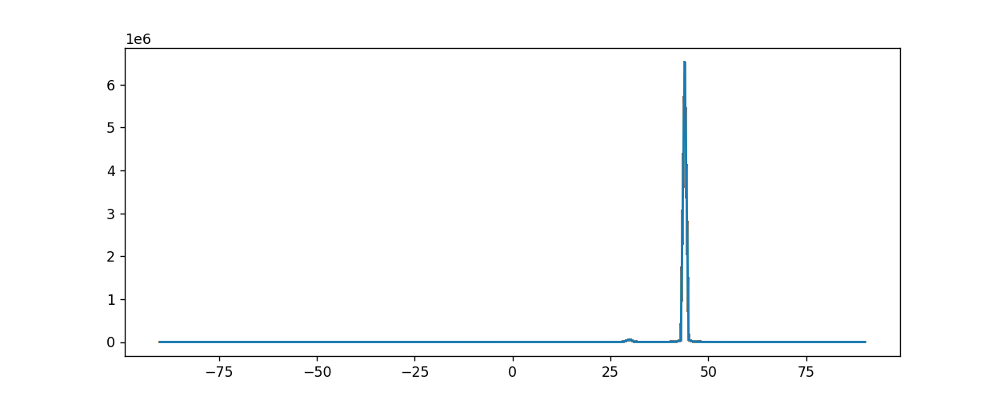

In [9]:
plt.figure(figsize=(10,4))
for item in Pmusic:
    plt.plot(angle,Pmusic)

In [41]:
v1 = np.array([[1,2],[2,3]])
v2 = np.array([[2,2],[1,2]])

result = v1 @ v2 
result

array([[ 4,  6],
       [ 7, 10]])

In [1]:
# 4 anten, 1 kaynak. #ilk baş 1 kaynak sinyalini oluşturalım.
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
pi = np.pi

t = np.linspace(0,1,1000)
N = len(t) #sample
M = 4 #anten sayısı
D = 1 #kaynak sayısı
lamda = 1
delta = lamda/2 #antenler arasındaki mesafe dalga boyunun yarısı kadar olsun.
tetha = np.array([30])
fc = 100000 #100 kHz
f = 10

original_source_signal = [5*np.cos(2*pi*f*t)] #s(t)
 #n(t) M adet dizi elemanı için kanal gürültüsüdür. Bizim için M 4 tür. Burada ortalaması 0 varyansı 1
#olan standart gauss dağılımıyla rastgele değer oluşturan randn fonksiyonuyla 4 ayrı t vektörünün büyüklüğü kadar AWGN elde edilmiştir.
#bu noise ile orijinal kaynak sinyalinin boyutları uymadığı için 4 değil 3 adet gürültü ürettim.

#xt = original_source_signal + noise

c = 2.998*10**8
#lamda = [c/f[0],c/f[1],c/f[2]] # c ışık hızı, f ise 3 sinyalin ayrı ayrı frekansları. Dalga boyu hesaplanıyor burada.


#listeler içinde bölme işlemi yapamadığım için formüllerin belli parçalarını aşağıda tanımlayıp liste içinde o tanımladıklarımı kullanıyorum.
radyan = pi/180
#pre = ((-2*pi)/lamda[]) # (−2π)/λ bunu yazdık.

#Mü_i leri oluşturmak için aşağıdaki kod bloğu kullanılıyor. i kaynak sayısı kadar itere olacak.Makalede verilen formül uygulandı 
#bahsedilen formül Eq.(6) dır. Bu mü_i terimi spatial frequency olarak geçiyor.





    




In [7]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
pi = np.pi
def create_signal(M,D,lamda,delta,tetha,signal,t):
    #M: Anten sayısı  D:Kaynak sayısı, lamda: Dalga boyu, delta: Antenler arası mesafe, tetha: Sinyal geliş açı matrisi
    #signal: Kaynaktan gelen sinyal, N: Örnek sayısı.
    
    mü = []
    noise = np.random.randn(M,len(t))
    pre = ((-2*pi)/lamda)
    for item in tetha:
        mü.append(pre*delta*np.sin(item*radyan))

#Aşağıdaki döngü bloğu ise makaledeki eq.(7) yi uygulamak içindir. 
    a_mü= np.array([[0 for row in range(M)] for col in range(D)],dtype=np.complex_) #dtype=np.complex_ yapmazsak arraye complex değerler koyamıyoruz.
    for element in range(D):# kaynak = 1
        for item in range(M):# Anten = 4
            a_mü[element][item]=(np.exp(1j*mü[element]*item)) #a(µi) vektörü.

        
    A = np.transpose(a_mü) #steering matrix
    x_t = np.matmul(A,signal)
    received_signal = x_t + noise

    
    return received_signal,x_t


<IPython.core.display.Javascript object>


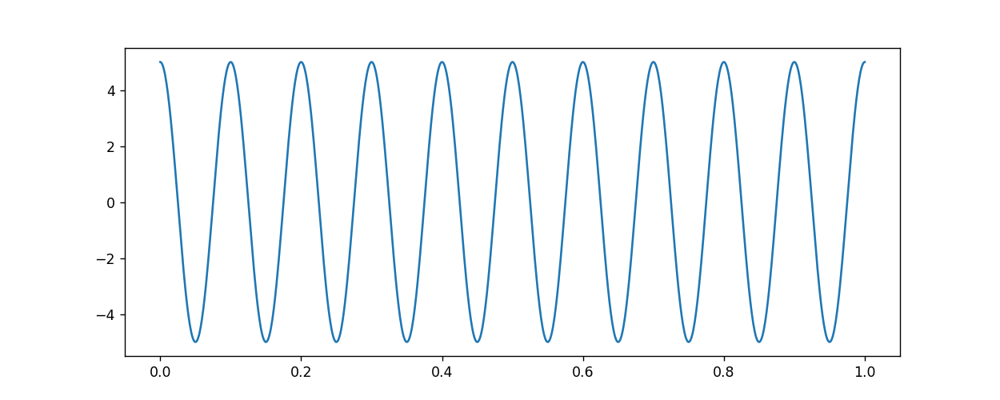

<IPython.core.display.Javascript object>


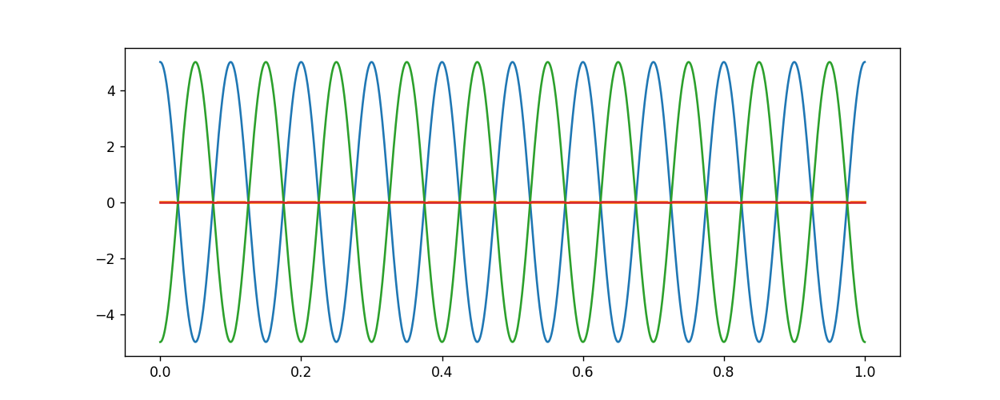

C:\Users\serdar.ozturk\AppData\Local\anaconda3\Lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


<IPython.core.display.Javascript object>


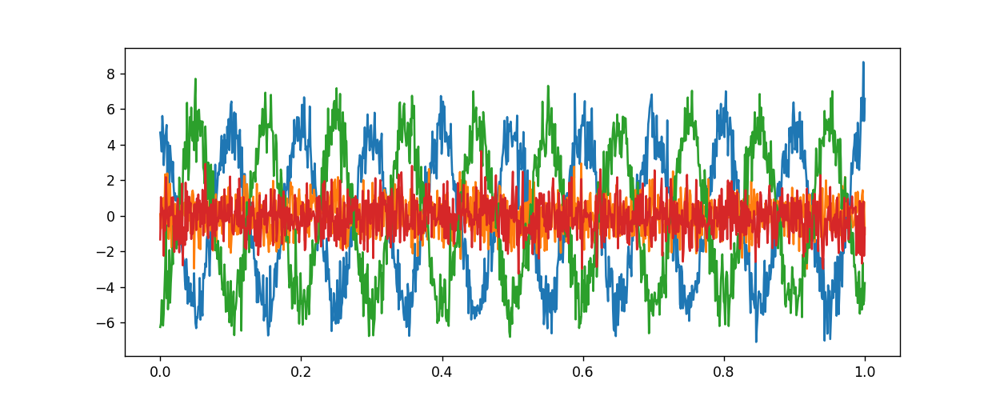

In [2]:
rec_sig,x_t = create_signal(M,D,lamda,delta,tetha,original_source_signal,t)

plt.figure(figsize=(10,4))
for item in original_source_signal:
    plt.plot(t,item)
    
plt.figure(figsize=(10,4))
for item in x_t:
    plt.plot(t,item)    
    
plt.figure(figsize=(10,4))
for item in rec_sig:
    plt.plot(t,item)


In [5]:
def music(received_signal,angle,M,lamda,delta):
    radyan = np.pi/180
    Cov_rec_sig = np.cov(received_signal)
    print(f"Kovaryans matris\n{Cov_rec_sig}") #Kovaryans matrisi bulduk.
    eigenvalues, eigenvectors = np.linalg.eig(Cov_rec_sig)
    print(f'\n\nEigenvalues:\n{eigenvalues}\n\nEigenvector:\n{eigenvectors}')
    signal_subspace = D
    noise_subspace = M-D
    Vn = np.array([[0]*(M-D)]*(M),dtype=np.complex_)
    eigenvectorss = np.array(eigenvectors).T
    Vn[:,0] = eigenvectorss[3]
    Vn[:,1] = eigenvectorss[2]
    Vn[:,2] = eigenvectorss[1]
    
    #Min_Eigenvalues = eigenvalues[D:]
    #Vn = np.array([[[0]*M]*(M-D)])
    #Vn[0] = np.array([eigenvectors[:,3]])
    #Vn[1] = np.array([eigenvectors[:,2]])
    #Vn[2] = np.array([eigenvectors[:,1]])
    print(f'\n\nVn:\n{Vn}')
   # for i in range(M-D):
   #     out = np.where(Min_Eigenvalues[i] == eigenvalues) #bulduğumuz min eigenvalue nin dizi içindeki indeksini buluyoruz.
   #     indeks = out[0][0]# indeks array şeklinde verildi. Saf indeks değerini çekiyoruz. Bu indeks değeriyle eigenvectoru bulacağız.
   #     print(f'\n\nMinimum Eigenvalue:\n{Min_Eigenv}')
   #     Vn[:,i] = np.array([eigenvectors[:,indeks]]).T #Vn in transpozunu alıp dikey vektör haline getirdim. Eigenvectorler genelde sutun olarak alınır.
   #     print(f'\n\nVn:\n{Vn}')
    Vn_H = np.conjugate(Vn.T)
    print(f'\n\nHermitian Vn:\n{Vn_H}')
    pre = ((-2*np.pi)/lamda)
    mü_new = []
    for item in angle:
        mü_new.append(pre*delta*np.sin(item*radyan))

    a_mü_new = np.array([[0 for row in range(len(angle))] for col in range(M)],dtype=np.complex_) #dtype=np.complex_ yapmazsak arraye complex değerler koyamıyoruz.
    for element in range(len(angle)):
        for item in range(M):
            a_mü_new[item][element]=(np.exp(1j*mü_new[element]*item)) #a(µi) vektörü.
    a_mü_new.shape #4x1000
    a_mü_new_H = np.conjugate(a_mü_new.T)
    a_mü_new_H.shape #1000x4

    Pmusic = np.array([0 for i in range(len(angle))])
    for item in range(len(angle)):
        if item !=180:
            final = np.matmul(a_mü_new_H[item:item+1],Vn @ Vn_H @ a_mü_new[:,item])
        else:
            final = np.matmul(a_mü_new_H[item:],Vn @ Vn_H @ a_mü_new[:,item])
        
    #first = np.matmul(a_mü_new_H[item],Vn)
    #second = np.matmul(first,Vn_H)
    #final = np.matmul(second,a_mü_new[:,item])
        Pmusic[item]=abs((1/(final)))
    return Pmusic


Kovaryans matris
[[ 1.34089999e+01+0.00000000e+00j -9.05454099e-03+1.24929188e+01j
  -1.26646902e+01+7.07791176e-15j  1.62834527e-02-1.24929188e+01j]
 [-9.05454099e-03-1.24929188e+01j  1.34456735e+01-2.59412806e-20j
   2.88068572e-02+1.26618439e+01j -1.25327821e+01-4.60727207e-02j]
 [-1.26646902e+01-7.07791176e-15j  2.88068572e-02-1.26618439e+01j
   1.38432621e+01+2.36404602e-32j  1.59925762e-03+1.26618439e+01j]
 [ 1.62834527e-02+1.24929188e+01j -1.25327821e+01+4.60727207e-02j
   1.59925762e-03-1.26618439e+01j  1.35554588e+01+4.30466843e-18j]]


Eigenvalues:
[51.31871268-3.20498967e-16j  1.06016283+1.28434656e-16j
  0.95327975-4.86868637e-16j  0.921239  -7.64356984e-16j]

Eigenvector:
[[-4.97437314e-01+1.45052564e-05j -2.39324727e-02+1.51510002e-01j
   6.59735564e-01+0.00000000e+00j -2.23573888e-02-5.41550744e-01j]
 [ 1.87796845e-04+4.98166595e-01j -1.33824568e-02-3.26529347e-01j
   1.00181741e-01-2.58144194e-01j  7.53893028e-01+0.00000000e+00j]
 [ 5.05105732e-01+0.00000000e+00j  2.996

<IPython.core.display.Javascript object>


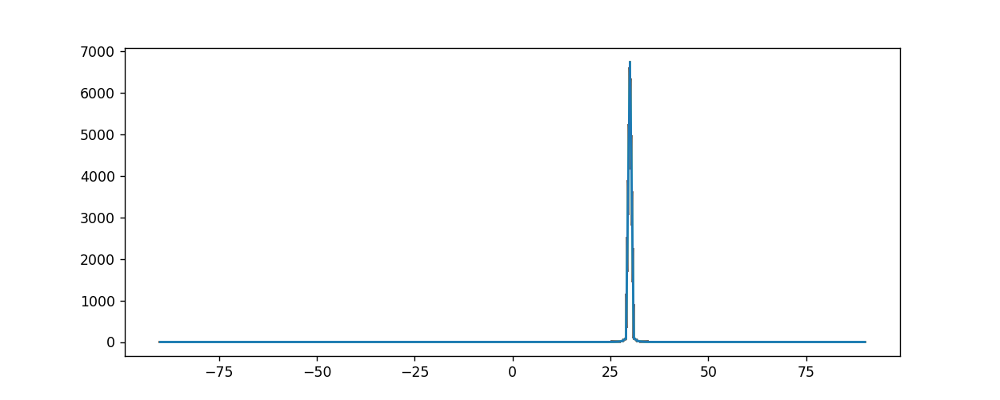

In [4]:
angle = np.arange(-90,91,1)
P = music(rec_sig,angle,M,lamda,delta)
plt.figure(figsize=(10,4))
for item in P:
    plt.plot(angle,P)

In [ ]:
#Sanıyorum ilk yazdığım music fonksiyonu. Yedek olarak kalması açısından burada bırakıyorum.
import math
def music(received_signal,angle,M,lamda,delta):
    radyan = np.pi/180
    Cov_rec_sig = np.cov(received_signal)
    print(f"Kovaryans matris\n{Cov_rec_sig}") #Kovaryans matrisi bulduk.
    eigenvalues, eigenvectors = np.linalg.eig(Cov_rec_sig)
    print(f'\n\nEigenvalues:\n{eigenvalues}\n\nEigenvector:\n{eigenvectors}')
    eigenvalues_yedek = eigenvalues
    signal_subspace = D
    noise_subspace = M-D
    Vn = np.array([[0]*(M-D)]*(M),dtype=np.complex_)
    eigenvectorss = np.array(eigenvectors).T #eigenvectorsün transpozunu almamın sebebi sütunları çekmektense onları satır olarak çekmenin daha kolay olması.
    for item in range(M-D):
        Min_Eigenv = min(eigenvalues_yedek)
        out = np.where(Min_Eigenv == eigenvalues)#bulduğumuz min eigenvalue nin dizi içindeki indeksini buluyoruz.
        out1 = np.where(Min_Eigenv == eigenvalues_yedek) 
        #Yukarıda eigenvalue_yedek değişkeni kullandık çünkü oradan minimum değeri çekip o dizide siliyoruz. Ana dizide de bunun indeksini buluyoruz.
        indeks = out[0][0]# indeks array şeklinde verildi. Saf indeks değerini çekiyoruz. Bu indeks değeriyle eigenvectoru bulacağız.
        indeks1 = out1[0][0]# yedek veriden değeri silmek için diğer indeksi çekiyoruz
        print(f'\n\nMinimum Eigenvalue:\n{Min_Eigenv}')
        Vn[:,item] = eigenvectorss[indeks]
        eigenvalues_yedek = np.delete(eigenvalues_yedek,indeks1)
    
    
    
    #for item in range(M-D)
     #   Vn[:,item] = eigenvectorss[3]
      #  Vn[:,1] = eigenvectorss[2]
       # Vn[:,2] = eigenvectorss[1]
    
    
    #Vn = np.array([[[0]*M]*(M-D)])
    #Vn[0] = np.array([eigenvectors[:,3]])
    #Vn[1] = np.array([eigenvectors[:,2]])
    #Vn[2] = np.array([eigenvectors[:,1]])
    print(f'\n\nVn:\n{Vn}')
   # for i in range(M-D):
   #     out = np.where(Min_Eigenvalues[i] == eigenvalues) #bulduğumuz min eigenvalue nin dizi içindeki indeksini buluyoruz.
   #     indeks = out[0][0]# indeks array şeklinde verildi. Saf indeks değerini çekiyoruz. Bu indeks değeriyle eigenvectoru bulacağız.
   #     print(f'\n\nMinimum Eigenvalue:\n{Min_Eigenv}')
   #     Vn[:,i] = np.array([eigenvectors[:,indeks]]).T #Vn in transpozunu alıp dikey vektör haline getirdim. Eigenvectorler genelde sutun olarak alınır.
   #     print(f'\n\nVn:\n{Vn}')
    Vn_H = np.conjugate(Vn.T)
    print(f'\n\nHermitian Vn:\n{Vn_H}')
    pre = ((-2*np.pi)/lamda)
    mü_new = []
    for item in angle:
        mü_new.append(pre*delta*np.sin(item*radyan))

    a_mü_new = np.array([[0 for row in range(len(angle))] for col in range(M)],dtype=np.complex_) #dtype=np.complex_ yapmazsak arraye complex değerler koyamıyoruz.
    for element in range(len(angle)):
        for item in range(M):
            a_mü_new[item][element]=(np.exp(1j*mü_new[element]*item)) #a(µi) vektörü.
    a_mü_new.shape #4x1000
    a_mü_new_H = np.conjugate(a_mü_new.T)
    a_mü_new_H.shape #1000x4

    Pmusic = np.array([0 for i in range(len(angle))],dtype=np.complex_)
    for item in range(len(angle)):
        if item !=180:
            final = np.matmul(a_mü_new_H[item:item+1],Vn @ Vn_H @ a_mü_new[:,item])
        else:
            final = np.matmul(a_mü_new_H[item:],Vn @ Vn_H @ a_mü_new[:,item])
        
    #first = np.matmul(a_mü_new_H[item],Vn)
    #second = np.matmul(first,Vn_H)
    #final = np.matmul(second,a_mü_new[:,item])
        Pmusic[item]=(1/(final))
    Pdb = np.array([0]*len(angle))
    for item in range(len(angle)):
        Pdb[item] = 10*math.log(abs(Pmusic[item]))
    return Pdb

In [1]:
def create_signal(M,D,lamda,delta,tetha,signal,t):
    #M: Anten sayısı  D:Kaynak sayısı, lamda: Dalga boyu, delta: Antenler arası mesafe, tetha: Sinyal geliş açı matrisi
    #signal: Kaynaktan gelen sinyal, N: Örnek sayısı.
    
    mü = []
    noise = 0.0004*np.random.randn(M,len(t))
    pre = ((-2*pi)/lamda)
    for item in tetha:
        mü.append(pre*delta*np.sin(item*radyan))

#Aşağıdaki döngü bloğu ise makaledeki eq.(7) yi uygulamak içindir. 
    a_mü= np.array([[0 for row in range(M)] for col in range(D)],dtype=np.complex_) #dtype=np.complex_ yapmazsak arraye complex değerler koyamıyoruz.
    for element in range(D):# kaynak = 1
        for item in range(M):# Anten = 4
            a_mü[element][item]=(np.exp(1j*mü[element]*item)) #a(µi) vektörü.

        
    A = np.transpose(a_mü) #steering matrix
    x_t = np.matmul(A,signal)
    received_signal = x_t + noise
    
    return received_signal,x_t


<IPython.core.display.Javascript object>


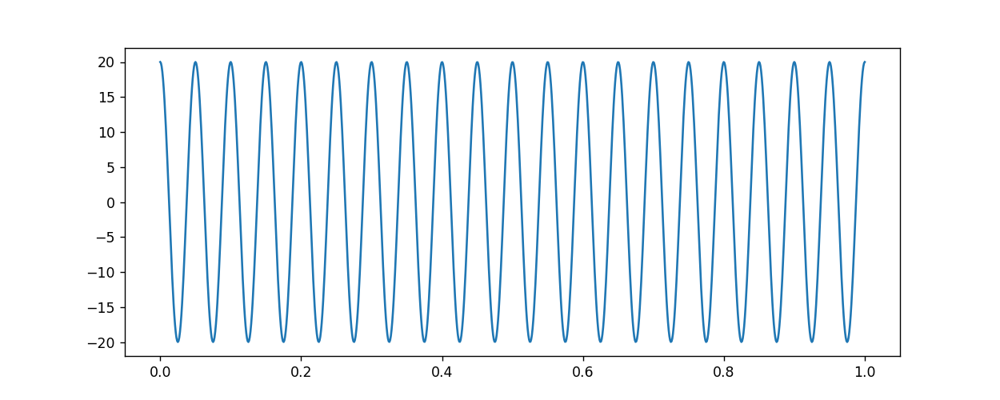

<IPython.core.display.Javascript object>


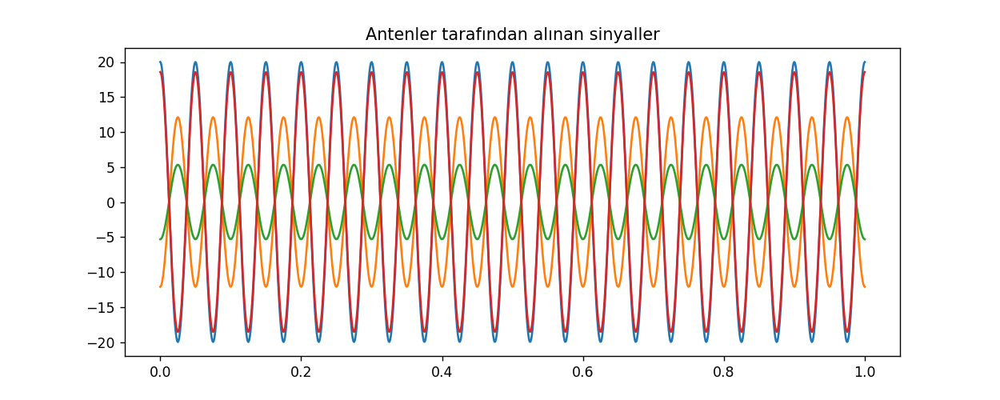

<IPython.core.display.Javascript object>


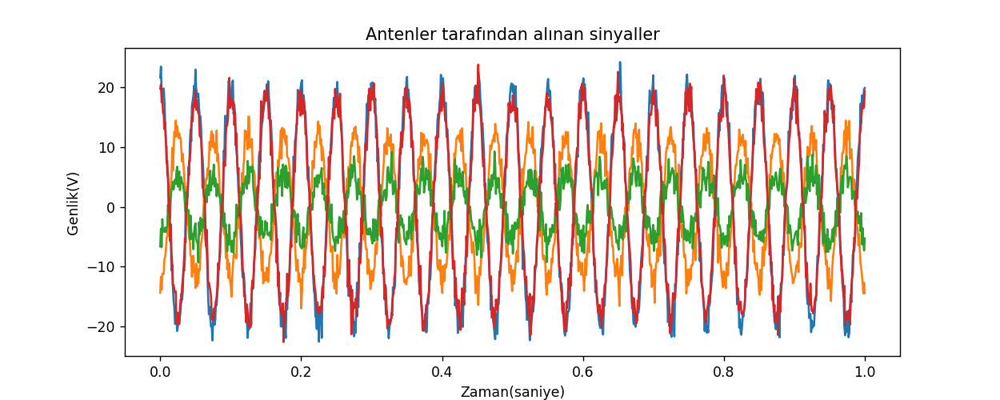

Text(0, 0.5, 'Genlik(V)')

In [4]:
# 4 anten, 2 kaynak. #ilk baş 1 kaynak sinyalini oluşturalım.
import DoA
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
pi = np.pi

t = np.linspace(0,1,1000)
N = len(t) #sample
M = 4 #anten sayısı
D = 1 #kaynak sayısı
lamda = 1
delta = lamda/2 #antenler arasındaki mesafe dalga boyunun yarısı kadar olsun.
tetha = np.array([45])
fc = 20#100 kHz
f1 = 10
original_source_signal = [20*np.cos(2*pi*fc*t)] #s(t)
radyan = pi/180
noise_db = 4

rec_sig,x_t = DoA.create_signal(M,D,lamda,delta,tetha,original_source_signal,t,noise_db)

plt.figure(figsize=(10,4))
for item in original_source_signal:
    plt.plot(t,item)
    
plt.figure(figsize=(10,4))
for item in x_t:
    plt.plot(t,item)    
plt.title("Antenler tarafından alınan sinyaller")

plt.figure(figsize=(10,4))
for item in rec_sig:
    plt.plot(t,item)
plt.title("Antenler tarafından alınan sinyaller")
plt.xlabel("Zaman(saniye)")
plt.ylabel("Genlik(V)")

Kovaryans matris
[[ 203.5254326   +0.j         -120.74183141+159.71703214j
   -53.23555575-193.48117027j  185.64169402 +74.66600609j]
 [-120.74183141-159.71703214j  201.85549333  +0.j
  -121.69444693+158.52709405j  -52.1540527 -192.36289265j]
 [ -53.23555575+193.48117027j -121.69444693-158.52709405j
   202.80454597  +0.j         -121.02065163+158.91863426j]
 [ 185.64169402 -74.66600609j  -52.1540527 +192.36289265j
  -121.02065163-158.91863426j  201.86284415  +0.j        ]]


Eigenvalues:
[802.46328478+3.02421289e-14j   2.64144531-1.08215024e-14j
   2.51269725+3.92171643e-14j   2.43088871-1.35028265e-15j]

Eigenvector:
[[ 0.50128108+0.j         -0.30159414-0.14135957j  0.67130601+0.j
  -0.00610529-0.4325352j ]
 [-0.30107255-0.3982318j   0.24715539+0.13578921j  0.37094512-0.15379969j
   0.71413418+0.j        ]
 [-0.13277062+0.48245007j  0.32694016-0.12575306j  0.50876409-0.3433507j
  -0.21439463+0.45190101j]
 [ 0.46304351-0.18624884j  0.82875222+0.j         -0.09393351+0.05039351j
  -0.1

<IPython.core.display.Javascript object>


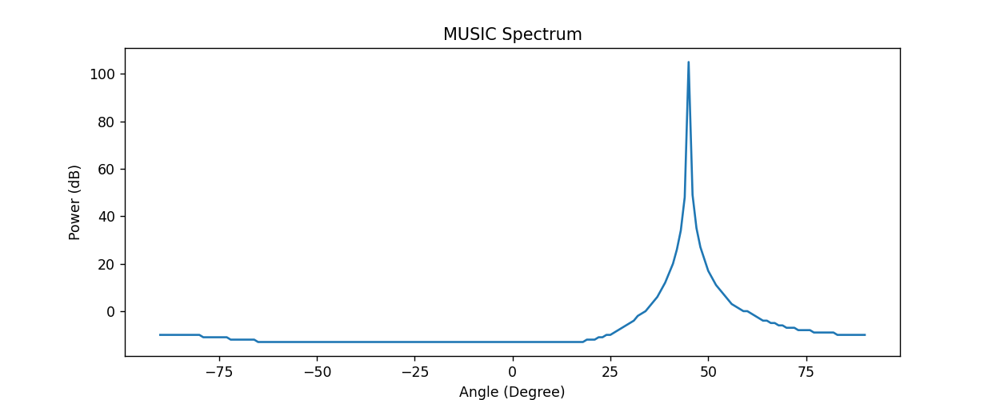

Text(0.5, 1.0, 'MUSIC Spectrum')

In [5]:
angle = np.arange(-90,91,1)
Pmusic = DoA.music(rec_sig,angle,M,D,lamda,delta)
plt.figure(figsize=(10,4))
plt.plot(angle,Pmusic)
plt.xlabel("Angle (Degree)")
plt.ylabel("Power (dB)")
plt.title("MUSIC Spectrum")

<IPython.core.display.Javascript object>


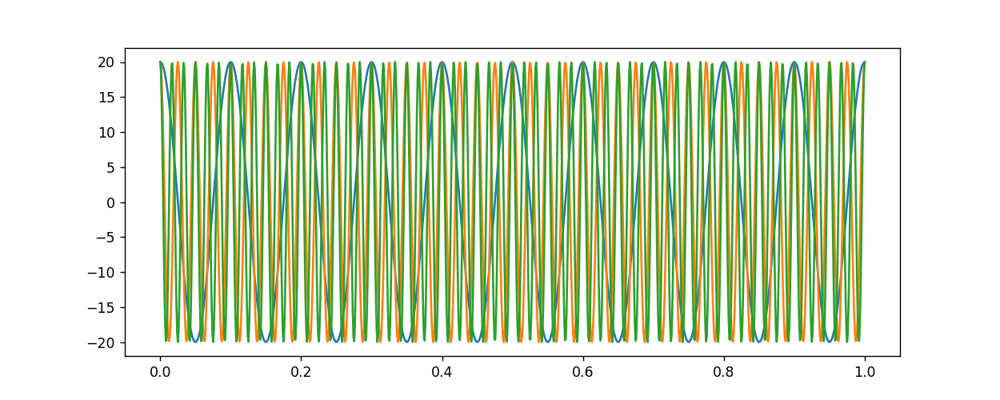

<IPython.core.display.Javascript object>


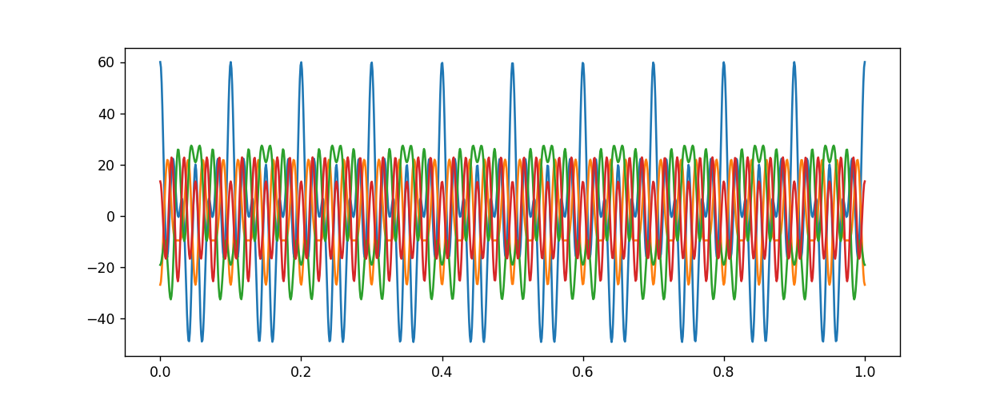

<IPython.core.display.Javascript object>


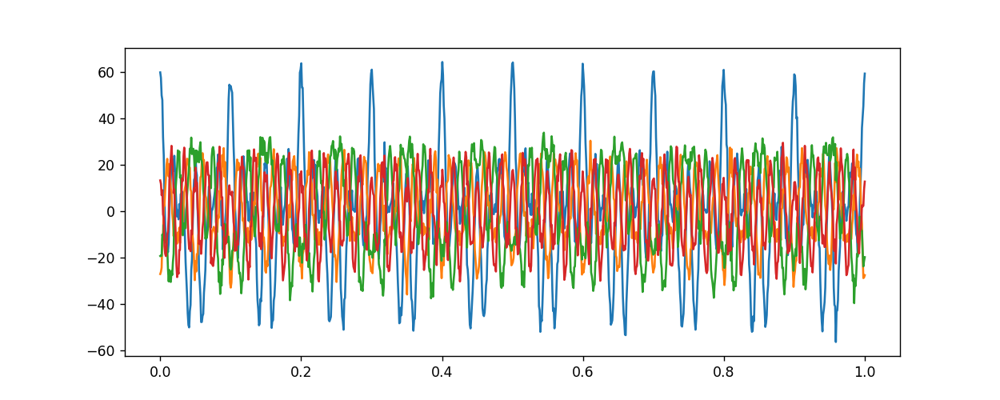

In [66]:
# 4 anten, 3 kaynak. #ilk baş 3 kaynak sinyalini oluşturalım.
import numpy as np
import matplotlib.pyplot as plt
import DoA
%matplotlib notebook
pi = np.pi

t = np.linspace(0,1,1000)
N = len(t) #sample
M = 4 #anten sayısı
D = 3 #kaynak sayısı
lamda = 1
delta = lamda/2 #antenler arasındaki mesafe dalga boyunun yarısı kadar olsun.
tetha = np.array([30,60,-40])
f1 = 10
f2 = 40
f3 = 60
original_source_signal = [20*np.cos(2*pi*f1*t),20*np.cos(2*pi*f2*t),20*np.cos(2*pi*f3*t)] #s(t)
radyan = pi/180
noise_db = 10
rec_sig,x_t = DoA.create_signal(M,D,lamda,delta,tetha,original_source_signal,t,noise_db)

plt.figure(figsize=(10,4))
for item in original_source_signal:
    plt.plot(t,item)
    
plt.figure(figsize=(10,4))
for item in x_t:
    plt.plot(t,item)    
    
plt.figure(figsize=(10,4))
for item in rec_sig:
    plt.plot(t,item)

Kovaryans matris
[[ 605.70874474  +0.j         -263.63645001 +99.28470503j
  -185.02480678  +8.03943635j  141.35664302 +36.58018842j]
 [-263.63645001 -99.28470503j  613.24234462  +0.j
  -255.94195356+105.356262j   -180.46613954 +10.89612164j]
 [-185.02480678  -8.03943635j -255.94195356-105.356262j
   613.58766632  +0.j         -257.73405382+101.72934564j]
 [ 141.35664302 -36.58018842j -180.46613954 -10.89612164j
  -257.73405382-101.72934564j  610.57829197  +0.j        ]]


Eigenvalues:
[  34.93776427-2.61741310e-14j  480.45271584-4.19651907e-14j
 1112.56177002-1.31470627e-14j  815.16479752+2.44429656e-14j]

Eigenvector:
[[ 0.38496323-0.15157873j -0.60119256+0.31319182j  0.51181672+0.j
  -0.23319755-0.23014808j]
 [ 0.57983944+0.j         -0.09641395+0.15103019j -0.35636457-0.33501658j
   0.62645721+0.j        ]
 [ 0.56866609+0.10108418j  0.17017812+0.08825405j -0.33616459+0.35461669j
  -0.52302245+0.34254837j]
 [ 0.33362912+0.21841679j  0.68674832+0.j          0.50943118-0.02306691j
   

<IPython.core.display.Javascript object>


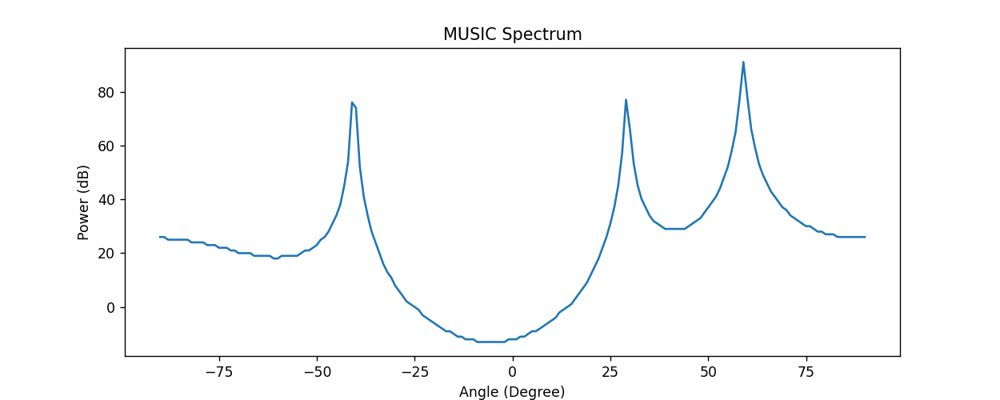

Text(0.5, 1.0, 'MUSIC Spectrum')

In [67]:
angle = np.arange(-90,91,1)
Pmusic = DoA.music(rec_sig,angle,M,D,lamda,delta)

plt.figure(figsize=(10,4))
plt.plot(angle,Pmusic)

plt.xlabel("Angle (Degree)")
plt.ylabel("Power (dB)")
plt.title("MUSIC Spectrum")

Kovaryans matris
[[ 617.60921511  +0.j         -261.22726763+101.94231901j
  -179.29344025  +6.06705003j  146.87244221 +38.06985661j
   144.92272728-398.76823945j  -42.62940921+501.35505495j
  -173.07926603 -29.71779831j  211.58794855-363.0022031j ]
 [-261.22726763-101.94231901j  606.16023902  +0.j
  -259.70187501+100.7262617j  -184.44162833  +9.72817584j
   140.17229101 +33.65581356j  141.93343547-393.2079755j
   -47.48508894+496.18172003j -174.46028832 -27.29236541j]
 [-179.29344025  -6.06705003j -259.70187501-100.7262617j
   613.14992901  +0.j         -258.38735847+105.19140015j
  -181.47119007  +6.35831036j  146.29272425 +37.04510962j
   144.04592551-393.53182905j  -41.87167842+498.85967517j]
 [ 146.87244221 -38.06985661j -184.44162833  -9.72817584j
  -258.38735847-105.19140015j  609.70941997  +0.j
  -260.52291546 +95.62967525j -181.22301332  +6.84460348j
   142.95355101 +31.62768801j  144.9554739 -396.60825423j]
 [ 144.92272728+398.76823945j  140.17229101 -33.65581356j
  -181.4711

<IPython.core.display.Javascript object>


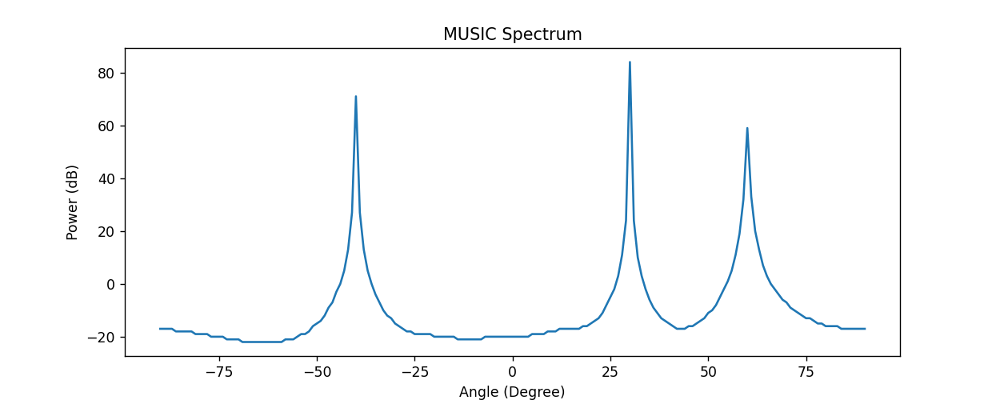

Text(0.5, 1.0, 'MUSIC Spectrum')

In [69]:
#Anten sayısını arttırınca spektrumda iyileşme göreceğiz
M = 8 #anten sayısı
rec_sig,x_t = DoA.create_signal(M,D,lamda,delta,tetha,original_source_signal,t,noise_db)
angle = np.arange(-90,91,1)
Pmusic = DoA.music(rec_sig,angle,M,D,lamda,delta)

plt.figure(figsize=(10,4))
plt.plot(angle,Pmusic)

plt.xlabel("Angle (Degree)")
plt.ylabel("Power (dB)")
plt.title("MUSIC Spectrum")

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook 
def create_signal_UCA(M,D,lamda,delta,phi,signal,t,r):
    #M: Anten sayısı  D:Kaynak sayısı, lamda: Dalga boyu, delta: Antenler arası mesafe, tetha: Sinyal geliş açı matrisi
    #signal: Kaynaktan gelen sinyal, N: Örnek sayısı.
    pi = np.pi
    radyan = pi/180
    noise = 10*np.random.randn(M,len(t))
    beta = ((2*pi)/lamda)
   # x_n = np.array([0 for i in range(M)])

    #x_n = np.array([r*np.cos(2*pi*i/M) for i in range(M)])
    #print(f'x_n: {x_n}\n')
    #y_n = np.array([r*np.sin(2*pi*i/M) for i in range(M)])
    #print(f'y_n: {y_n}\n')
    #p_n = np.array([0 for i in range(M)])
    #for item in phi:
     #   for n in range(M):
      #      p_n[n] = x_n[n]*np.cos(item*radyan)+y_n[n]*np.sin(item*radyan) #Açı derece cinsinden yazıldığı için radyana çevirdik.
           # p_n[n] = n
       #     print(p_n[n])
    #print(p_n)
    a_phi = np.array([[0]*D]*M,dtype=np.complex_)
    
    #Alttaki döngü array manifoldu oluşturuyor.
    for item in range(D):#sinyal sayısı
        for n in range(M):#anten sayısı
            #a_phi[n][item] = np.exp(1j*beta*r*np.cos(phi-2*n*pi/M))
            print(phi[item])
            a_phi[n][item] = np.exp(1j*2*pi*(r/lamda)*np.cos(np.deg2rad(phi[item])-((n/M)*2*pi))) #exp in içine bak
    
    print(a_phi)
    print(f'a_phi dimensions: {a_phi.shape}')
    x_k = (a_phi @ signal)  #X(k) nın gürültüsüz halinin oluşturulması.
    print(x_k)
    print(x_k.shape)
    received_signal = x_k + noise
    print(received_signal.shape)
    
    return received_signal,x_k

S: (2, 1000)
-120
-120
-120
-120
-120
-120
55
55
55
55
55
55
[[ 2.83276945e-16-1.00000000e+00j -2.29094355e-01+9.73404220e-01j]
 [-1.00000000e+00+7.65713740e-16j -9.99928543e-01+1.19544238e-02j]
 [-1.71512450e-15-1.00000000e+00j  2.40714472e-01+9.70595973e-01j]
 [ 1.61554457e-15+1.00000000e+00j -2.29094355e-01-9.73404220e-01j]
 [-1.00000000e+00-7.65713740e-16j -9.99928543e-01-1.19544238e-02j]
 [ 5.05321550e-16+1.00000000e+00j  2.40714472e-01-9.70595973e-01j]]
a_phi dimensions: (6, 2)
[[ -4.58188711-0.53191559j  -4.43765189-1.10521543j
   -4.01402713-2.78668733j ...  -4.01402713-2.78668733j
   -4.43765189-1.10521543j  -4.58188711-0.53191559j]
 [-39.99857087+0.23908848j -39.32948271+0.23156211j
  -37.36200996+0.20945685j ... -37.36200996+0.20945685j
  -39.32948271+0.23156211j -39.99857087+0.23908848j]
 [  4.81428943-0.58808054j   4.66273832-1.15961233j
    4.21762648-2.83589143j ...   4.21762648-2.83589143j
    4.66273832-1.15961233j   4.81428943-0.58808054j]
 [ -4.58188711+0.53191559j  

<IPython.core.display.Javascript object>


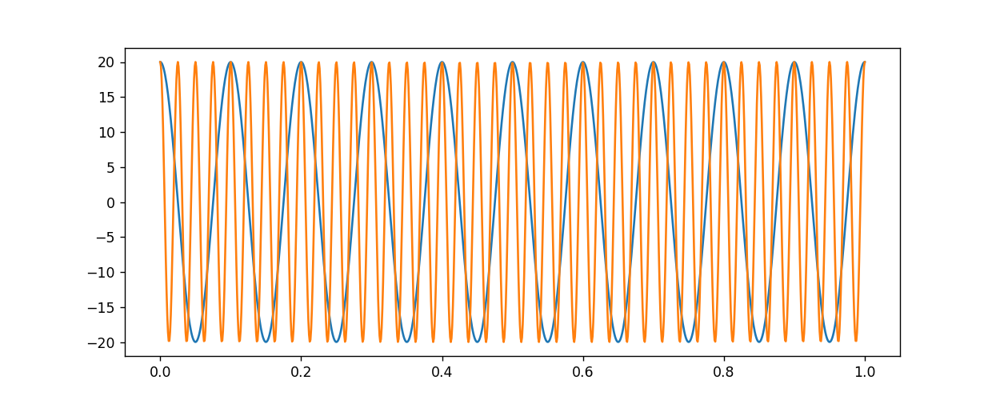

<IPython.core.display.Javascript object>


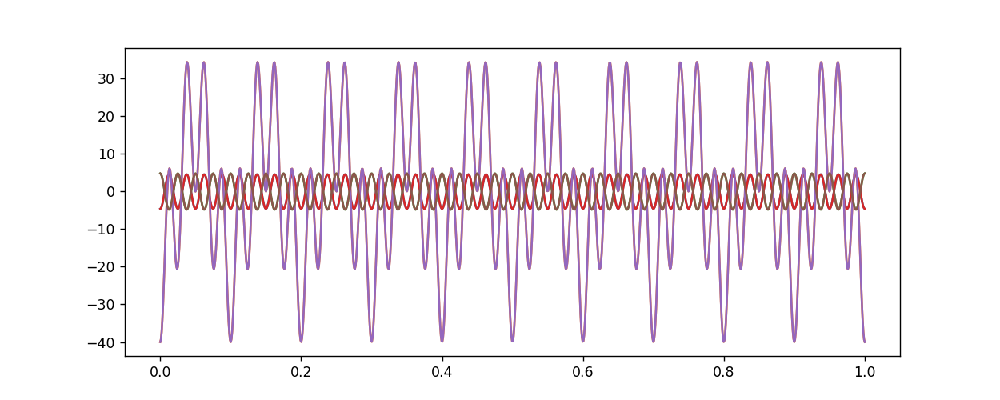

<IPython.core.display.Javascript object>


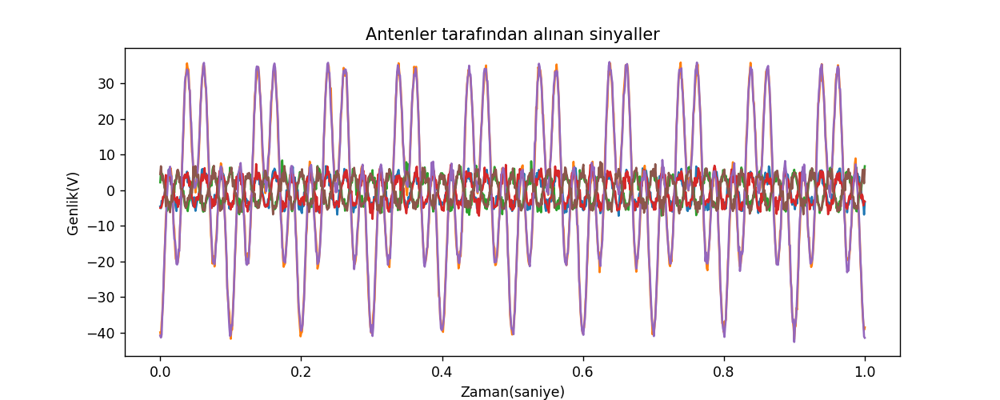

15000000.000000002


Text(0, 0.5, 'Genlik(V)')

In [2]:
import DoA
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook 
M=6 # anten
D=2 # sinyal
lamda = 1
delta = lamda/2
t = np.linspace(0,1,1000)
phi = np.array([-120,55])
c=3*10**8
f = 10
lamda = c/f
signal = np.array([20*np.cos(2*np.pi*f*t),20*np.cos(2*np.pi*40*t)])
print(f"S: {signal.shape}")
r = lamda/(4*np.sin(np.pi/6))
#r=lamda/2
noise_db = 1
rec_sig,x_k = DoA.create_signal_UCA(M,D,lamda,delta,phi,signal,t,r,noise_db)

plt.figure(figsize=(10,4))
for item in signal:
    plt.plot(t,item)
    
plt.figure(figsize=(10,4))
for item in x_k:
    plt.plot(t,item)    
    
plt.figure(figsize=(10,4))
for item in rec_sig:
    plt.plot(t,item)
print(r)
plt.title("Antenler tarafından alınan sinyaller")
plt.xlabel("Zaman(saniye)")
plt.ylabel("Genlik(V)")

Kovaryans matris
[[ 401.41313366 +0.j           49.55710546 +7.23547149j
   377.92428766+90.42688566j -378.85599893-89.16685942j
    45.1571966  +4.56418178j -400.07845723 +2.68621222j]
 [  49.55710546 -7.23547149j  402.97480407 +0.j
   -45.35769179 -6.67183271j   43.03379248 +6.13246731j
   402.12117723 -4.79708562j  -50.59261374 +7.81890555j]
 [ 377.92428766-90.42688566j  -45.35769179 +6.67183271j
   401.1354631  +0.j         -399.92116315 +1.51913605j
   -50.30370751 +6.25471741j -376.82994427+92.84363578j]
 [-378.85599893+89.16685942j   43.03379248 -6.13246731j
  -399.92116315 -1.51913605j  401.28738913 +0.j
    47.9398377  -5.66718596j  377.953615  -91.59396183j]
 [  45.1571966  -4.56418178j  402.12117723 +4.79708562j
   -50.30370751 -6.25471741j   47.9398377  +5.66718596j
   403.76454938 +0.j          -46.13828174 +5.10764457j]
 [-400.07845723 -2.68621222j  -50.59261374 -7.81890555j
  -376.82994427-92.84363578j  377.953615  +91.59396183j
   -46.13828174 -5.10764457j  401.25324617

<IPython.core.display.Javascript object>


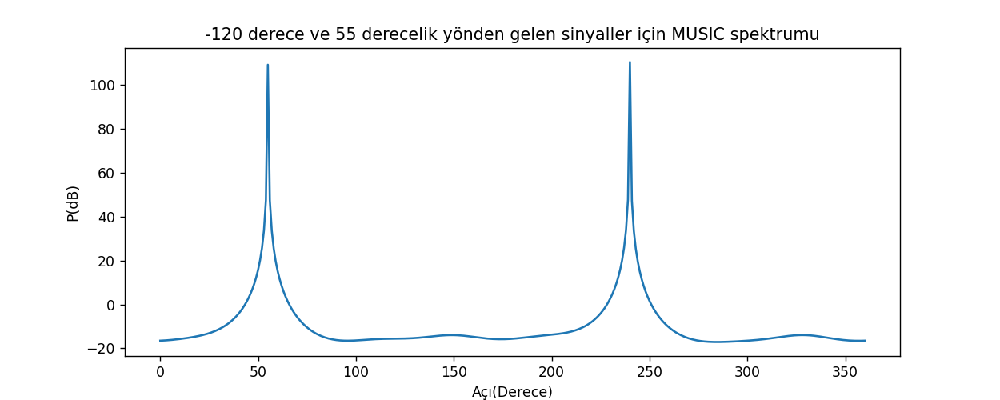

Text(0.5, 1.0, '-120 derece ve 55 derecelik yönden gelen sinyaller için MUSIC spektrumu')

In [3]:
import math
angle = np.arange(0,361,1)
Pmusic = DoA.music_UCA(rec_sig,angle,M,D,lamda,delta)
plt.figure(figsize=(10,4))
plt.plot(angle,Pmusic)
plt.xlabel("Açı(Derece)")
plt.ylabel("P(dB)")
plt.title("-120 derece ve 55 derecelik yönden gelen sinyaller için MUSIC spektrumu")

S: (5, 1000)
200
200
200
200
200
200
200
200
200
200
200
200
200
200
420
420
420
420
420
420
420
420
420
420
420
420
420
420
30
30
30
30
30
30
30
30
30
30
30
30
30
30
35
35
35
35
35
35
35
35
35
35
35
35
35
35
300
300
300
300
300
300
300
300
300
300
300
300
300
300
[[ 0.93930624-0.34307986j -0.92568474-0.37829586j  0.98561351-0.16901484j
   0.87724026-0.48005159j -0.92568474-0.37829586j]
 [ 0.73790792-0.67490141j  0.9001478 -0.4355846j   0.72746881+0.68614075j
   0.77542605+0.63143839j  0.86405471+0.5033979j ]
 [ 0.96646083+0.25681405j  0.76672963+0.64197015j  0.95883074+0.28397817j
   0.88340917+0.46860242j -0.84586274-0.53340062j]
 [-0.77233161+0.63521955j  0.89503193+0.44600207j  0.08889722-0.9960408j
   0.49839567-0.86694969j  0.44600207+0.89503193j]
 [ 0.63888063-0.76930588j  0.44600207-0.89503193j -0.48809725+0.87278925j
  -0.88657967+0.46257594j  0.89503193-0.44600207j]
 [-0.62679342+0.77918548j -0.84586274+0.53340062j  0.49574536-0.86846793j
   0.90486622-0.42569606j  0.76672963

<IPython.core.display.Javascript object>


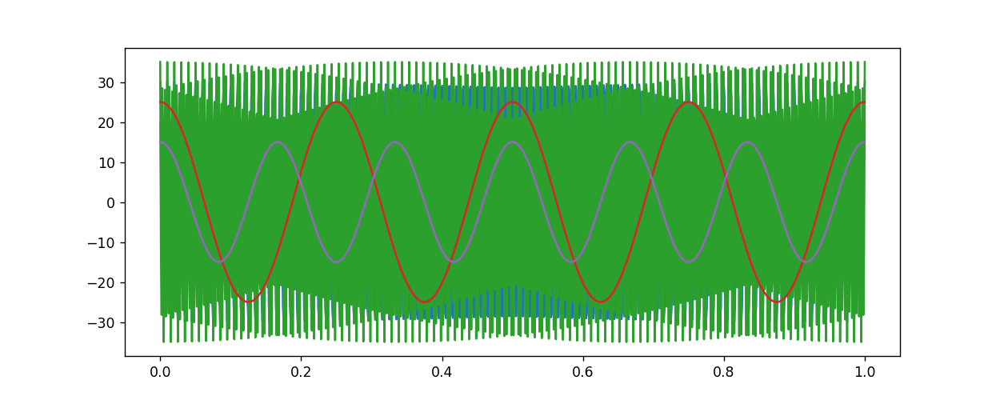

<IPython.core.display.Javascript object>


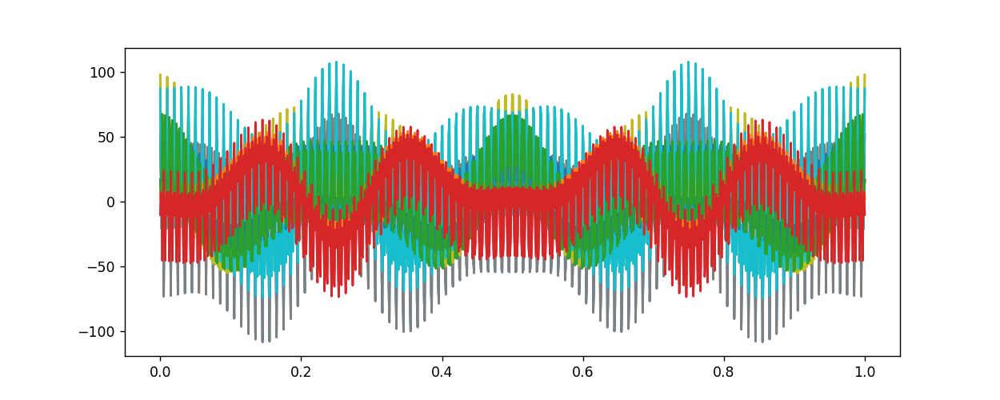

<IPython.core.display.Javascript object>


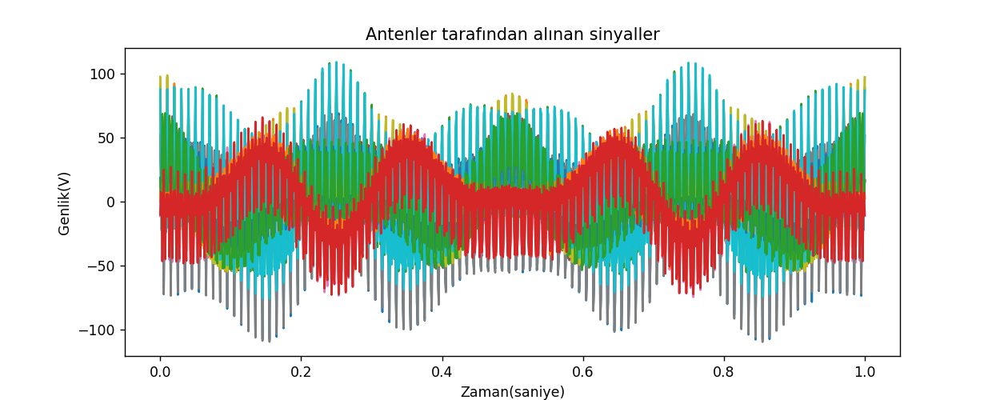

3370.4694055762006


Text(0, 0.5, 'Genlik(V)')

In [4]:
import DoA
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook 
M=14 # anten
D=5 # sinyal
lamda = 1
delta = lamda/2
t = np.linspace(0,1,1000)
phi = np.array([200,420,30,35,300])
c=3*10**8
f = 100000
noise_db = 2
lamda = c/f
signal = np.array([30*np.cos(2*np.pi*f*t),20*np.cos(2*np.pi*200000*t),
                   35*np.cos(2*np.pi*300000*t),25*np.cos(2*np.pi*4000000*t),15*np.cos(2*np.pi*6000000*t)])
print(f"S: {signal.shape}")
r = lamda/(4*np.sin(np.pi/M))
#r=lamda/2
rec_sig,x_k = DoA.create_signal_UCA(M,D,lamda,delta,phi,signal,t,r,noise_db)

plt.figure(figsize=(10,4))
for item in signal:
    plt.plot(t,item)
    
plt.figure(figsize=(10,4))
for item in x_k:
    plt.plot(t,item)    
    
plt.figure(figsize=(10,4))
for item in rec_sig:
    plt.plot(t,item)
print(r)
plt.title("Antenler tarafından alınan sinyaller")
plt.xlabel("Zaman(saniye)")
plt.ylabel("Genlik(V)")

Kovaryans matris
[[ 1690.92876766   +0.j           661.51293442 -745.73419585j
   1010.77395052 -753.81680257j  -282.45585003 +695.34982944j
   -398.0633961  -528.84087247j   380.38288779 +284.9580774j
   -782.82305683  -91.53380832j  1311.66280923 -542.69451101j
    759.70912236  -82.96541515j  1346.31675129  -60.76136263j
   -409.05308526 -800.45461351j  -490.25544804 +554.02356373j
    339.35127087 -404.476965j    -876.2559061  +242.86618606j]
 [  661.51293442 +745.73419585j  1698.6918943    +0.j
   1077.23480916 -221.75893181j  -661.30076361 +594.3768495j
    692.31317045 -603.97345693j  -613.208167   +894.69184067j
    520.21420022 -592.3388109j    765.95982065  -84.43995735j
    328.23892835 +413.52222531j   981.25632866 +564.1003172j
    881.40335656  +42.61197351j  -796.71017132 -519.63758668j
    924.26889908 +495.96072109j  -952.88199182 -526.17367074j]
 [ 1010.77395052 +753.81680257j  1077.23480916 +221.75893181j
   1699.10169184   +0.j          -270.82853715 +654.18233333j


dimension of a_phi: (14, 3610)
dimension of a a_phi_H: (3610, 14)


<IPython.core.display.Javascript object>


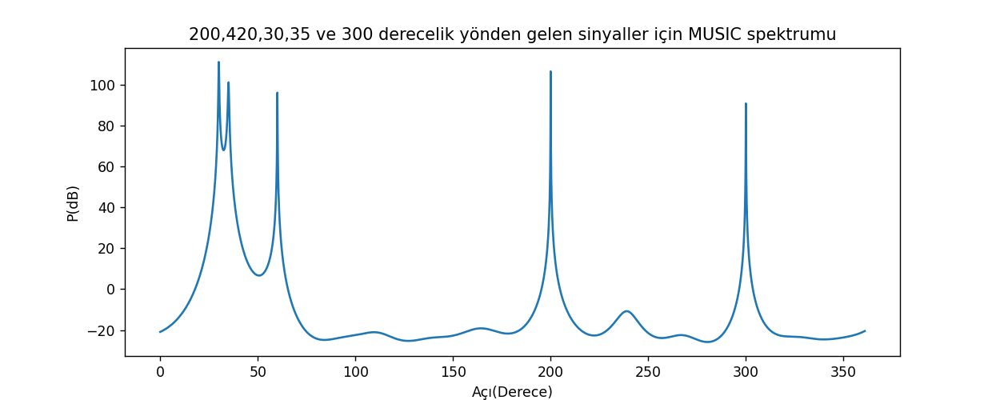

Text(0.5, 1.0, '200,420,30,35 ve 300 derecelik yönden gelen sinyaller için MUSIC spektrumu')

In [5]:
import math
angle = np.arange(0,361,0.1)
Pmusic = DoA.music_UCA(rec_sig,angle,M,D,lamda,delta)
plt.figure(figsize=(10,4))
plt.plot(angle,Pmusic)
plt.xlabel("Açı(Derece)")
plt.ylabel("P(dB)")
plt.title("200,420,30,35 ve 300 derecelik yönden gelen sinyaller için MUSIC spektrumu")

# Yukarıdaki spektrumda UCA konfigürasyonunda 5 adet sinyal anten sayısı ve örnekleme sayısı arttırılarak yüksek hassasiyetli bir şekilde tespit edilebilmiştir.

Kovaryans matris
[[ 1329.76187695   +0.j           523.99755448-1103.50611446j
     94.95074697+1037.16652351j  -478.07100342  -65.91946355j
  -1190.13614663 -227.8031533j ]
 [  523.99755448+1103.50611446j  1359.87943635   +0.j
  -1002.09811568 +580.28401455j    55.73775637 -359.01566133j
   -319.07729502-1219.75271302j]
 [   94.95074697-1037.16652351j -1002.09811568 -580.28401455j
   1354.68972017   +0.j          -512.38311728  -73.75294278j
   -304.92207224+1160.63371409j]
 [ -478.07100342  +65.91946355j    55.73775637 +359.01566133j
   -512.38311728  +73.75294278j  1350.9202233    +0.j
    265.23631858 -209.24670802j]
 [-1190.13614663 +227.8031533j   -319.07729502+1219.75271302j
   -304.92207224-1160.63371409j   265.23631858 +209.24670802j
   1374.79517987   +0.j        ]]


Eigenvalues:
[5043.45000453-9.96173988e-14j 1423.56383267-6.29596185e-14j
   93.51967865+8.03695514e-14j  108.84427929-7.83089402e-14j
  100.6686415 +4.68295684e-14j]

Eigenvector:
[[-0.47610398-0.07538101j -0.1

<IPython.core.display.Javascript object>


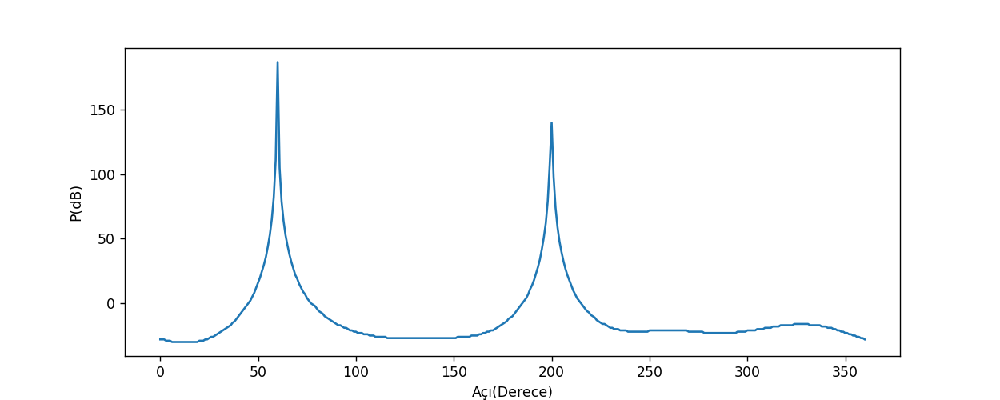

Text(0, 0.5, 'P(dB)')

In [11]:
import math
angle = np.arange(0,361,1)
Pmusic = DoA.music_UCA(rec_sig,angle,M,D,lamda,delta)
plt.figure(figsize=(10,4))
Pdb = np.array([0]*len(angle))
for item in range(len(angle)):
    Pdb[item] = 20*math.log(abs(Pmusic[item]))
plt.plot(angle,Pdb)
plt.xlabel("Açı(Derece)")
plt.ylabel("P(dB)")

## Bundan sonraki kısım Elevation açısıyla birlikte DoA çalışmaları.

S: (2, 1000)
40
40
40
40
40
40
40
40
180
180
180
180
180
180
180
180
[[-0.00139062+9.99999033e-01j -0.75473061+6.56034842e-01j]
 [-0.45621596+8.89869088e-01j -0.91544709-4.02438342e-01j]
 [ 0.24892953+9.68521600e-01j  1.        +2.36182051e-16j]
 [ 0.98404473-1.77921251e-01j -0.91544709+4.02438342e-01j]
 [-0.00139062-9.99999033e-01j -0.75473061-6.56034842e-01j]
 [-0.45621596-8.89869088e-01j -0.91544709+4.02438342e-01j]
 [ 0.24892953-9.68521600e-01j  1.        +2.36182051e-16j]
 [ 0.98404473+1.77921251e-01j -0.91544709-4.02438342e-01j]]
a_phi dimensions: (8, 2)
[[-30.23094291+56.24136467j -30.21340674+50.49248076j
  -30.16385941+35.44278699j ... -30.16385941+35.44278699j
  -30.21340674+50.49248076j -30.23094291+56.24136467j]
 [-50.30436268+10.59853898j -47.67382842 +5.4952633j
  -40.78451886 -7.85956474j ... -40.78451886 -7.85956475j
  -47.67382842 +5.4952633j  -50.30436268+10.59853898j]
 [ 47.4678859 +29.05564799j  46.02622691+23.49576689j
   42.24814487 +8.9439218j  ...  42.24814488 +

<IPython.core.display.Javascript object>


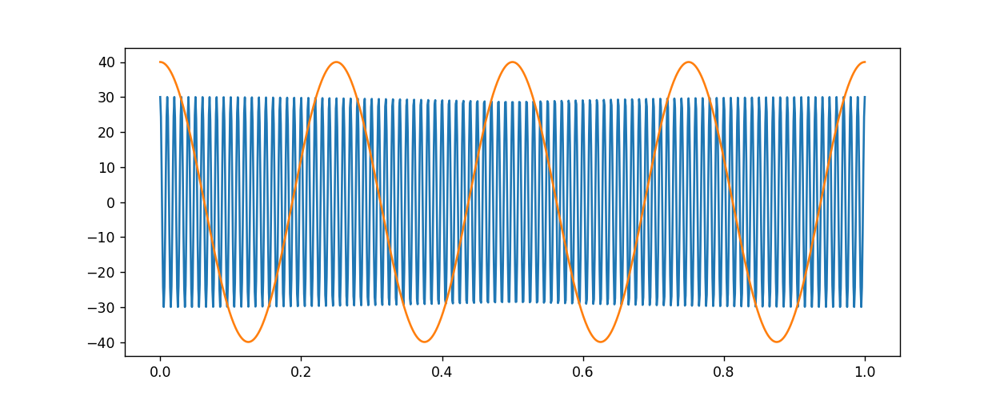

<IPython.core.display.Javascript object>


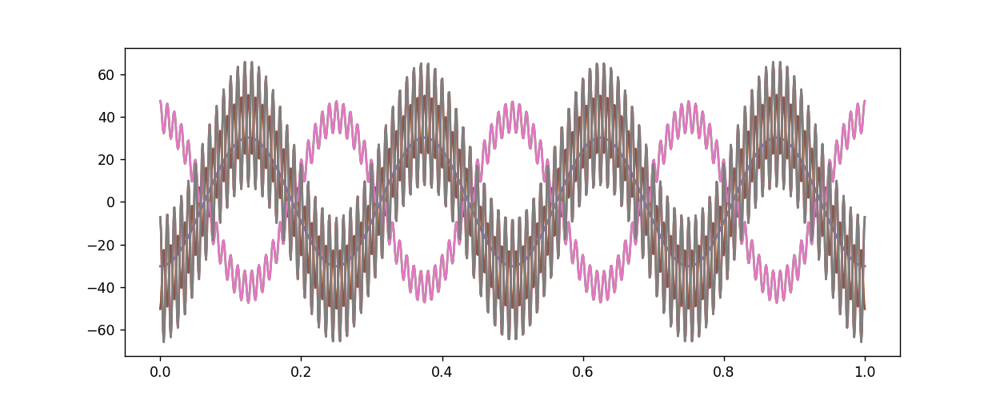

<IPython.core.display.Javascript object>


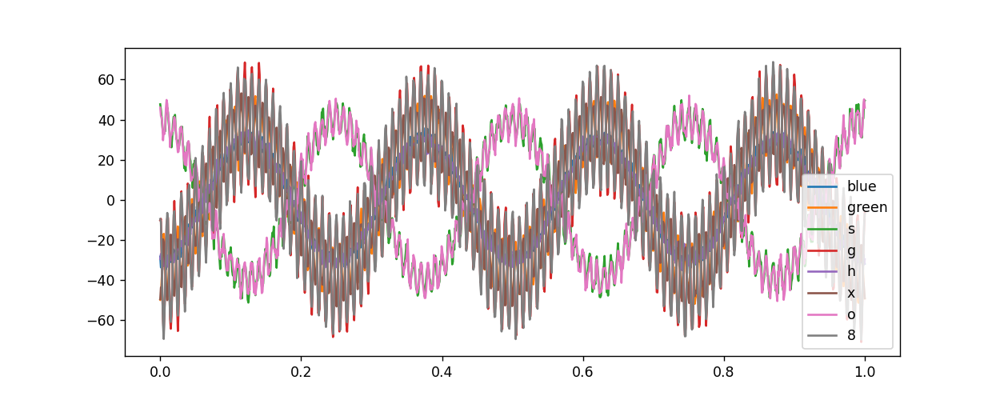

In [9]:
import DoA
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook 
M=8 # anten
D=2 # sinyal
lamda = 1
delta = lamda/2
t = np.linspace(0,1,1000)
phi = np.array([40,180])
elevation = np.array([30,70])
c=3*10**8
f = 100000
lamda = c/f
signal = np.array([30*np.cos(2*np.pi*f*t),40*np.cos(2*np.pi*4000000*t)])
print(f"S: {signal.shape}")
noise_db = 8
rec_sig,x_k = DoA.create_signal_UCA_e(M,D,lamda,delta,phi,signal,t,elevation,noise_db)

plt.figure(figsize=(10,4))
for item in signal:
    plt.plot(t,item)
    
plt.figure(figsize=(10,4))
for item in x_k:
    plt.plot(t,item)    
    
plt.figure(figsize=(10,4))
for item in rec_sig:
    plt.plot(t,item)
plt.legend(["blue", "green","s","g","h","x","o","8","son"], loc ="lower right")

a_phi: 
 [[[ 1.        +0.00000000e+00j  1.        +0.00000000e+00j
    1.        +0.00000000e+00j ...  1.        +0.00000000e+00j
    1.        +0.00000000e+00j  1.        +0.00000000e+00j]
  [ 1.        +0.00000000e+00j  1.        +0.00000000e+00j
    1.        +0.00000000e+00j ...  1.        +0.00000000e+00j
    1.        +0.00000000e+00j  1.        +0.00000000e+00j]
  [ 1.        +0.00000000e+00j  1.        +0.00000000e+00j
    1.        +0.00000000e+00j ...  1.        +0.00000000e+00j
    1.        +0.00000000e+00j  1.        +0.00000000e+00j]
  ...
  [ 1.        +0.00000000e+00j  1.        +0.00000000e+00j
    1.        +0.00000000e+00j ...  1.        +0.00000000e+00j
    1.        +0.00000000e+00j  1.        +0.00000000e+00j]
  [ 1.        +0.00000000e+00j  1.        +0.00000000e+00j
    1.        +0.00000000e+00j ...  1.        +0.00000000e+00j
    1.        +0.00000000e+00j  1.        +0.00000000e+00j]
  [ 1.        +0.00000000e+00j  1.        +0.00000000e+00j
    1.        +0

Pmusic:
[[-18.6311594 +0.j -18.6311594 +0.j -18.6311594 +0.j ... -18.6311594 +0.j
  -18.6311594 +0.j -18.6311594 +0.j]
 [-18.49452982+0.j -18.49186756+0.j -18.4892432 +0.j ... -18.49996295+0.j
  -18.49722871+0.j -18.49452982+0.j]
 [-18.35488988+0.j -18.34853608+0.j -18.34224835+0.j ... -18.36777997+0.j
  -18.36130582+0.j -18.35488988+0.j]
 ...
 [-15.24047365+0.j -15.35488971+0.j -15.51068834+0.j ... -15.14429905+0.j
  -15.16990442+0.j -15.24047365+0.j]
 [-15.23714253+0.j -15.35178434+0.j -15.50789388+0.j ... -15.14079948+0.j
  -15.1664407 +0.j -15.23714253+0.j]
 [-15.23603265+0.j -15.35074942+0.j -15.50696233+0.j ... -15.13963405+0.j
  -15.16528691+0.j -15.23603265+0.j]]


<IPython.core.display.Javascript object>


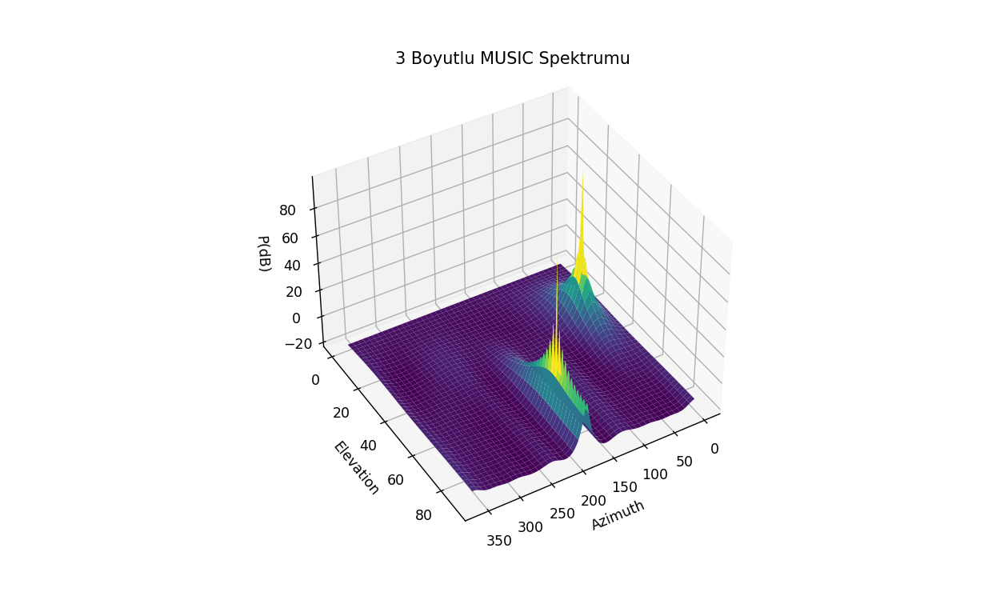

Text(0.5, 0.92, '3 Boyutlu MUSIC Spektrumu')

In [12]:
import math
import DoA
angle = np.arange(0,361,1)
elevation = np.arange(0,91,1)
Angle, Elevation = np.meshgrid(angle, elevation)
Pmusic = DoA.music_UCA_2D(rec_sig,angle,M,D,lamda,delta,elevation)
#plt.figure(figsize=(10,4))
fig = plt.figure(figsize=(10, 6))       
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(Angle, Elevation, Pmusic, cmap='viridis')
ax.view_init(azim=0, elev=90)
plt.show()
plt.xlabel("Azimuth")
plt.ylabel("Elevation")
ax.set_zlabel("P(dB)")
plt.title("3 Boyutlu MUSIC Spektrumu")

# ROOT MUSIC KISMI

<IPython.core.display.Javascript object>


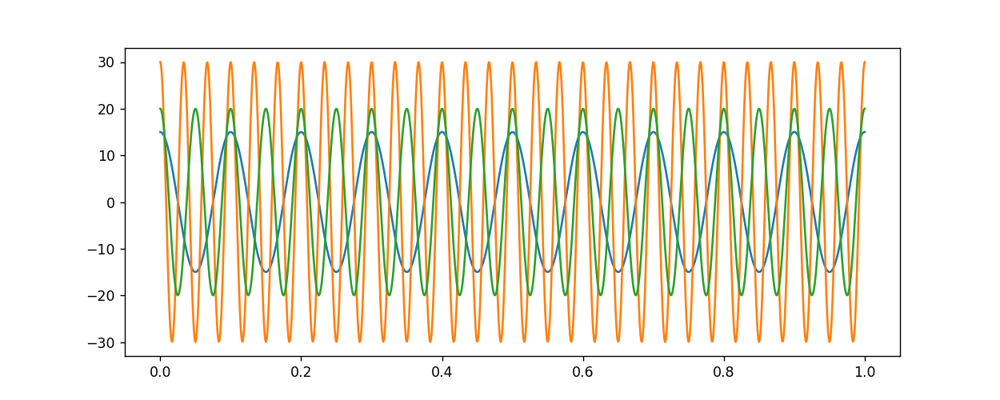

<IPython.core.display.Javascript object>


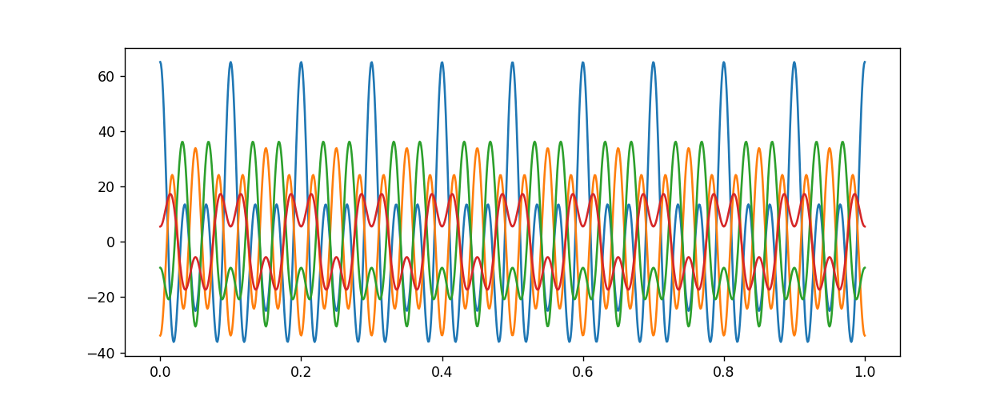

<IPython.core.display.Javascript object>


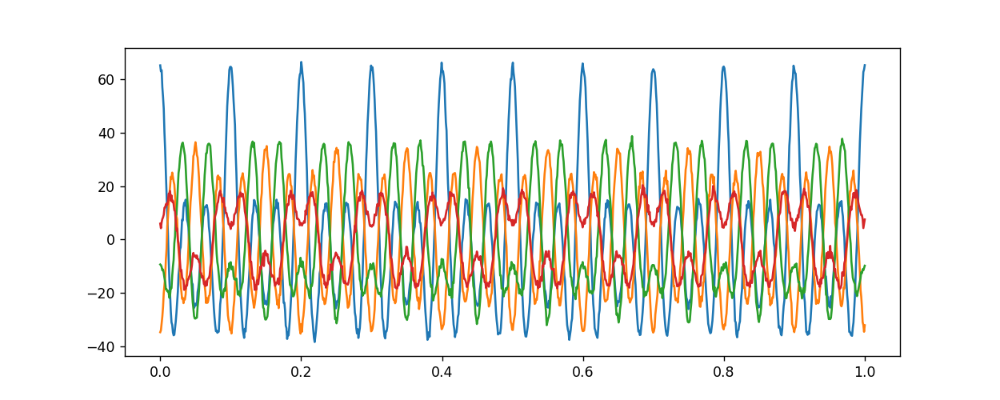

In [5]:
# 4 anten, 3 kaynak. #ilk baş 3 kaynak sinyalini oluşturalım.
import numpy as np
import matplotlib.pyplot as plt
import DoA
%matplotlib notebook
pi = np.pi

t = np.linspace(0,1,1000)
N = len(t) #sample
M = 4 #anten sayısı
D = 3 #kaynak sayısı
lamda = 1
delta = lamda/2 #antenler arasındaki mesafe dalga boyunun yarısı kadar olsun.
tetha = np.array([40,60,-30])
f1 = 10
original_source_signal = [15*np.cos(2*pi*f1*t),30*np.cos(2*pi*30*t),20*np.cos(2*pi*20*t)] #s(t)
radyan = pi/180

rec_sig,x_t = DoA.create_signal(M,D,lamda,delta,tetha,original_source_signal,t)

plt.figure(figsize=(10,4))
for item in original_source_signal:
    plt.plot(t,item)
    
plt.figure(figsize=(10,4))
for item in x_t:
    plt.plot(t,item)    
    
plt.figure(figsize=(10,4))
for item in rec_sig:
    plt.plot(t,item)

In [6]:
Pmusic = DoA.root_MUSIC(rec_sig,M,D,lamda,delta)
print(f'\n\nAçı değerleri şöyledir \n {Pmusic}')

Kovaryans matris
[[ 765.77578432  +0.j         -460.51550635 +85.26594768j
    28.92969557-425.07204758j  -26.286996  +605.73905024j]
 [-460.51550635 -85.26594768j  763.72828525  +0.j
  -458.43835193 +87.17561763j   28.81970594-423.41385061j]
 [  28.92969557+425.07204758j -458.43835193 -87.17561763j
   763.65324702  +0.j         -461.54933498 +85.46060123j]
 [ -26.286996  -605.73905024j   28.81970594+423.41385061j
  -461.54933498 -85.46060123j  765.45138252  +0.j        ]]


Eigenvalues:
[2.12915932e+03+5.06083728e-14j 7.36091371e+02-4.10107725e-14j
 1.92341195e+02+2.02991792e-14j 1.01681364e+00+5.53683489e-14j]

Eigenvector:
[[ 0.53113953+0.j          0.07834897-0.32323138j -0.27308152-0.59971283j
   0.4031218 +0.1026525j ]
 [-0.43048354-0.17967074j  0.6249848 +0.j         -0.18881759+0.17240762j
   0.5074517 +0.26251217j]
 [ 0.17620425+0.4328436j  -0.30990919+0.54039442j -0.07760474+0.24446725j
   0.57248748+0.j        ]
 [ 0.00393833-0.53092006j -0.31945704-0.09302834j  0.65924791+0

In [170]:
import cmath
import math
faz = cmath.phase(Pmusic[3])
print(faz)
print(Pmusic)
faz_son = np.rad2deg(faz)
np.rad2deg(np.arcsin(lamda*faz/(2*np.pi*delta)))

0.0
[42.85455637 42.85455637 39.56707515 39.56707515]


0.0

In [89]:
matri = np.array([[1,2,3],[7,5,6],[7,8,9]])
print(matri)
print(sum(np.diag(matri,k=2)))

[[1 2 3]
 [7 5 6]
 [7 8 9]]
3


In [97]:
abs(0.34806462-2.40362126j)
abs(-1+0.52191952+0.8550141j)
abs(1+0.99694026+0.08427146j)
abs(1+0.73978648+0.66910677j)


1.0025155092145885


In [149]:
print(1-abs(1.15851571-2.28586764j))
print(1-abs(0.52122888+0.85427362j))
print(1-abs(0.52046745+0.85302567j))
print(1-abs(-0.99878798+0.08459584j))
print(1-abs(-0.99408211+0.08419726j))
print(1-abs(0.17640537-0.34806548j))

-1.5626840456669595
-0.0007312142498399066
0.000730686857416063
-0.002364147971078534
0.0023585714227983834
0.6097841200918813


<IPython.core.display.Javascript object>


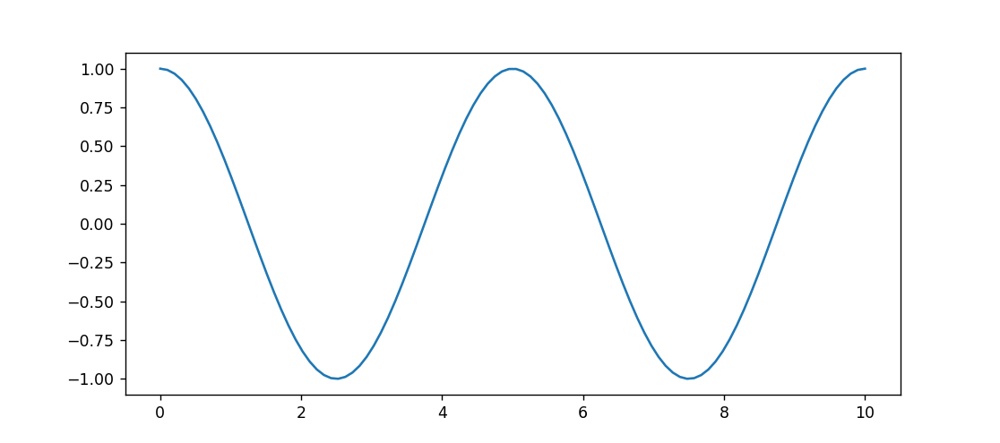

In [25]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
t = np.linspace(0,10,100)
y = np.cos(2*np.pi*20*t)
plt.plot(t,y)       